![image info](./Image_Avis_Resto.png)

L'analyse exploratoire tient près d'1/3 du volume de cette page. Pour aller droit au but, rdv au 1-3

## Table des matières : 
#### [Prérequis](#partie_0)
### [ Partie 1 : Traitement de données textuelles](#partie_21)
##### [ 1-1 Chargement des données et EDA basique](#partie_21)
##### [ 1-2 Analyses exploratoires complémentaires](#partie_22)
##### [ 1-3 Méthode à bas niveau : KMeans sur bag-of-stems "fait main"](#partie_23)
##### [ 1-4 Méthode et automatisation avancées : vectorisation Scikit Learn et ajustement du nombre de topics du modèle LDA](#partie_24)
##### [ 1-5 Visualisation des différents modèles avec pyLDAvis](#partie_25)
### [ Partie 2 : Traitement d'images](#partie_11)
##### [ 2-1 Brève analyse exploratoire des métadonnées](#partie_11)
##### [ 2-2 Nettoyage](#partie_12)
##### [ 2-3 Mode supervisé : fonctions de traitement, détection ORB/SIFT et classification Random Forest](#partie_13)
##### [ 2-3-1 Définitions des pré-traitements et des détecteurs de features](#partie_13)
##### [ 2-3-2 Pré-traitement en nuances de gris, détection SIFT et classification Random Forest](#partie_132)
##### [2-3-3 Pré-traitement couleur, détection ORB et classification Random Forest](#partie_14)
##### [ 2-4 Classification non-supervisée : Transfer learning avec VGG16 et KMeans](#partie_15)
##### [ 2-4-1 Extraction de features](#partie_15)
##### [ 2-4-2 Fine tuning partiel](#partie_16)
### [ Partie 3 : Récupération des données via l'API Yelp](#partie_3)

<a id='partie_0'></a><br><br>

#### Prérequis : 

In [1]:
cd C:\\Users\\Wince\\Downloads\\OC\\Projet_6\\data

C:\Users\Wince\Downloads\OC\Projet_6\data


In [2]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import math
from math import sqrt
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
import os
import random
from os.path import isfile, join
import cv2 as cv
import sys
import json
import keras
import nltk
import plotly.express as px
import warnings



warnings.filterwarnings("ignore", category=DeprecationWarning)

%load_ext pycodestyle_magic


INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2


On crée un paramètre debug afin de pouvoir exécuter le programme en mode rapide, on ne chargera que des quantités échantillonnesques de données tant que l'on laisse ce paramètre true. Les quantités de données correspondant aux modes debug/normal sont définies à chaque étape correspondant au chargement en ram des différentes données utilisées. 

In [3]:
debug = True

<a id='partie_21'></a><br><br>

## Partie 1 : Traitement des données textuelles 
### 1-1 Chargement des données et EDA basique: 
Pour l'EDA, je rappelle des fonctions écrites lors des projets OC précédents que j'ai stockées dans un script. 
Les fonctions utilisées sont recopiées dans la cellule ci-dessous afin que le livrable soit autoporteur. 
La lecture du code n'est donc pas nécessairement pertinente. 

In [4]:

from IPython import display

warnings.filterwarnings("ignore", category=DeprecationWarning)


def fill_rates(df):
    fill_ratio = pd.DataFrame((df.shape[0]
                               - df.isna().sum().sort_values(
                                   ascending=True)) / df.shape[0])
    return fill_ratio


def detailed_info(df, limite_aff=35, decr=True, save_plot=False, titre=""):
    gabarit = max([limite_aff, df.shape[1]])
    print(f"\n{'':-<116}\n{'':-<116}\n\n")
    nom = str.upper(df.name)
    types_df = pd.DataFrame(df.dtypes.value_counts(), columns=['n_features'])
    strbuffer = "INFORMATIONS DE BASE SUR LE DATAFRAME : "
    print(f'{strbuffer:>75} {nom}\n')
    print(f"\nDimensions du dataframe : {df.shape}\n")
    print(f"Types de données contenues:\n{types_df}\n")
    fill_ratio = pd.DataFrame(
        (df.shape[0] - df.isna().sum().sort_values(ascending=decr))
        / df.shape[0])
    tete = fill_ratio.head(limite_aff)
    if decr:
        t = "décroissant"
    else:
        t = "croissant"
    z = min(df.shape[1], limite_aff)
    print(f"Taux de remplissage des {z} premières variables par ordre {t} :")
    print(f"\n{tete}\n\n{'':-<116}")
    strbuffer = 'TABLEAU DESCRIPTIF DES CATEGORIES DU DATAFRAME'
    print(f"{strbuffer:>80} {str.upper(df.name)} \n{'':-<116}\n")
    if df.select_dtypes(include='O').shape[1] > 0:
        display.display(df.describe(include='O'))
    else:
        strbuffer = 'PAS DE VARIABLE CATEGORIQUE DANS LE DF '
        print(f'{strbuffer}{str.upper(df.name)}')
    strbuffer = 'TABLEAU DESCRIPTIF DES VARIABLES NUMERIQUES DU DATAFRAME'
    print(f"\n{'':-<116}\n{strbuffer:>85} {str.upper(df.name)} \n{'':-<116}\n")
    if df.select_dtypes(include='number').shape[1] > 0:
        display.display(df.describe(include='number'))
        print(f"\n{'':-<116}\n")
    else:
        strbuffer = 'PAS DE VARIABLE NUMERIQUE DANS LE DF '
        print(f'{strbuffer}{str.upper(df.name)}\n{"":-<116}\n\n')
    # Graphe de remplissage des variables
    plt.figure(figsize=(0.5*gabarit, 0.3*gabarit))
    p = sns.barplot(x=tete.index, y=tete[0], palette='Blues')
    strbuffer = 'Taux de remplissage des '
    strbuff2 = ' premières variables du dataframe '
    p.set_title(f"{strbuffer}{z}{strbuff2}{df.name} par ordre {t} : ")
    p.set_xticklabels(tete.index, size=18, rotation='vertical')
    plt.show(block=False)
    if save_plot:
        plt.savefig(titre)
    print(f"\n{'':-<116}\n{'':-<116}\n")


def boxes(df, size='s'):
    col = df.select_dtypes(exclude='O').columns
    y = math.ceil(math.sqrt(len(col)))
    sizedict = {'s': [4*y, 3*y], 'm': [6*y, 4*y], 'l': [8*y, 5*y]}
    fontdict = {'s': 1, 'm': 1.5, 'l': 2}
    plt.rcParams['figure.figsize'] = sizedict[size]
    fig, axs = plt.subplots(y, y, gridspec_kw={'hspace': 0.5, 'wspace': 0.3})
    fig.suptitle('Boxplots des variables continues',
                 size=8*sqrt(y)*fontdict[size])
    cum = 0
    for i in range(y):
        for j in range(y):
            for tick in axs[i][j].xaxis.get_major_ticks():
                tick.label.set_fontsize(5*sqrt(y)*fontdict[size])
            for tick in axs[i][j].yaxis.get_major_ticks():
                tick.label.set_fontsize(5*sqrt(y)*fontdict[size])
                tick.label.set_rotation(45)
            if (cum + j >= len(col)):
                for n in range(j, y, 1):
                    axs[i, n].set_visible(False)
                break
            axs[i][j].boxplot(df[:][col[cum+j]].dropna())
            axs[i][j].set_title(f"Distribution de {col[cum+j]}",
                                fontsize=5*sqrt(y)*fontdict[size])
        cum += y
    plt.show()


def histo(df, bins=100, size='s'):
    col = df.select_dtypes(include='number').columns
    y = math.ceil(sqrt(len(col)))
    sizedict = {'s': [4*y, 3*y], 'm': [6*y, 4*y], 'l': [8*y, 5*y]}
    fontdict = {'s': 1, 'm': 1.5, 'l': 2}
    plt.rcParams['figure.figsize'] = sizedict[size]
    fig, axs = plt.subplots(y, y, gridspec_kw={'hspace': 0.5, 'wspace': 0.3})
    fig.suptitle('Histogrammes des variables continues',
                 size=8*sqrt(y)*fontdict[size])
    cum = 0
    for i in range(y):
        for j in range(y):
            for tick in axs[i, j].xaxis.get_major_ticks():
                tick.label.set_fontsize(5*sqrt(y)*fontdict[size])
            for tick in axs[i, j].yaxis.get_major_ticks():
                tick.label.set_fontsize(5*sqrt(y)*fontdict[size])
                tick.label.set_rotation(45)
            if (cum + j >= len(col)):
                for n in range(j, y, 1):
                    axs[i, n].set_visible(False)
                break
            axs[i][j].hist(df[:][col[cum + j]].dropna(), bins=bins)
            axs[i][j].set_title(f"{col[cum + j]}",
                                fontsize=5*sqrt(y)*fontdict[size])
        cum += y
    plt.show()


On change de répertoire de travail : 

In [5]:
cd C:\\Users\\Wince\\Downloads\\OC\\Projet_6\\Data\\extracted

C:\Users\Wince\Downloads\OC\Projet_6\Data\extracted


<br>Puis on charge tout ou partie de nos données texte (20% en mode debug, l'intégralité sinon) : 

In [6]:
wd = os.getcwd()
filenames = [f for f in os.listdir(wd) if isfile(join(wd, f))]


def file_loading(filename, rate=1):
    elements = []
    with open(filename, encoding="utf-8") as f:
        ff = sorted(f)
        sample_length = math.ceil(len(ff) * rate)
        lines = random.sample(ff, sample_length)
        for line in lines:
            elements.append(json.loads(line))
    df = pd.DataFrame(elements)
    return df


df_space = {}
rate = 0.5 if debug else 1
for name in filenames:
    df_space[name.split('.json')[0].split(
        'yelp_academic_dataset_')[1]] = file_loading(name, rate)
    print(f'fichier {name} chargé')

fichier yelp_academic_dataset_business.json chargé
fichier yelp_academic_dataset_checkin.json chargé
fichier yelp_academic_dataset_review.json chargé
fichier yelp_academic_dataset_tip.json chargé
fichier yelp_academic_dataset_user.json chargé


In [7]:
df_space['user'] = df_space['user'].rename(columns={'name': 'user_name'})
df_space['business'] = df_space['business'].rename(
    columns={'name': 'business_name'})

<br>
On exécute la fonction d'écriture des infos sur l'ensemble des df chargés, puis on lit le rapport d'EDA obtenu : 


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------


                                   INFORMATIONS DE BASE SUR LE DATAFRAME :  BUSINESS


Dimensions du dataframe : (104697, 14)

Types de données contenues:
         n_features
object            9
float64           3
int64             2

Taux de remplissage des 14 premières variables par ordre décroissant :

                      0
business_id    1.000000
business_name  1.000000
address        1.000000
city           1.000000
state          1.000000
postal_code    1.000000
latitude       1.000000
longitude      1.000000
stars          1.000000
review_count   1.000000
is_open        1.000000
categories     0.997507
attributes     0.861706
hours          0.785075

----------------------------------------------------------------------------------------------

,business_id,business_name,address,city,state,postal_code,attributes,categories,hours
count,104697,104697,104697,104697,104697,104697,90218,104436,82195
unique,104697,82476,88328,926,28,13046,41500,55740,32806
top,A7waf6G3cvnLfAqKeLL8DA,Starbucks,,Las Vegas,AZ,89109,{'BusinessAcceptsCreditCards': 'True'},"Nail Salons, Beauty & Spas","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."
freq,1,596,4275,15652,30441,1704,5959,546,4520



--------------------------------------------------------------------------------------------------------------------
                             TABLEAU DESCRIPTIF DES VARIABLES NUMERIQUES DU DATAFRAME BUSINESS 
--------------------------------------------------------------------------------------------------------------------



,latitude,longitude,stars,review_count,is_open
count,104697.000000,104697.000000,104697.000000,104697.000000,104697.000000
mean,38.594494,-97.403264,3.536114,36.651757,0.807034
std,4.962955,16.712600,1.021187,120.606542,0.394629
min,21.497258,-158.025525,1.000000,3.000000,0.000000
25%,33.638095,-112.269145,3.000000,4.000000,1.000000
50%,36.146824,-111.743580,3.500000,9.000000,1.000000
75%,43.617982,-79.972265,4.500000,27.000000,1.000000
max,51.299943,-72.911982,5.000000,10129.000000,1.000000



--------------------------------------------------------------------------------------------------------------------



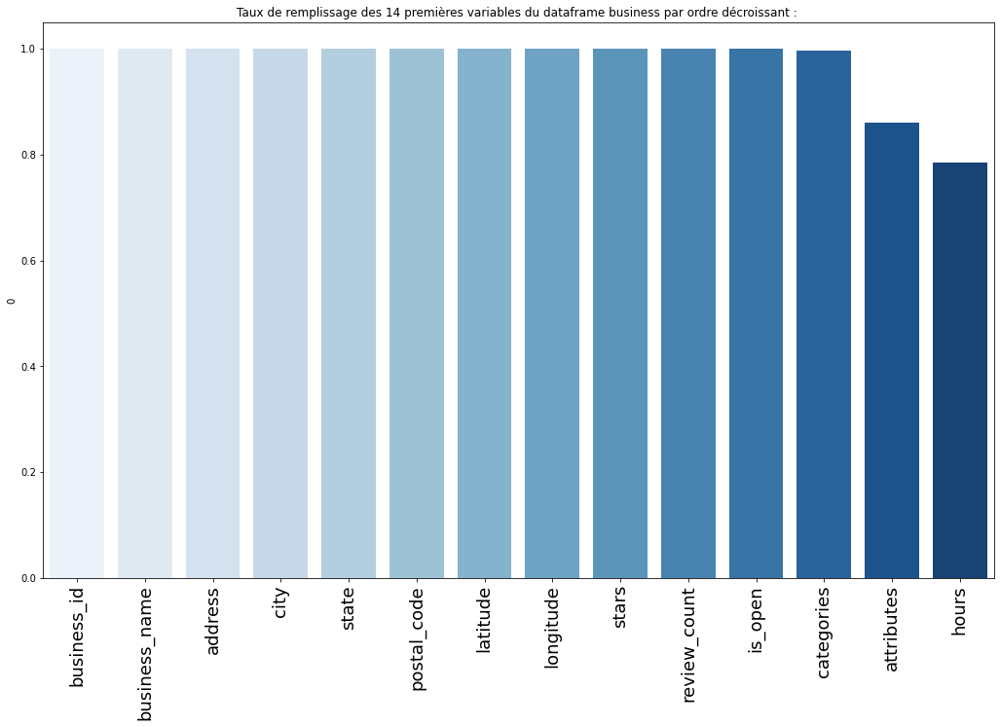


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------


                                   INFORMATIONS DE BASE SUR LE DATAFRAME :  CHECKIN


Dimensions du dataframe : (87594, 2)

Types de données contenues:
        n_features
object           2

Taux de remplissage des 2 premières variables par ordre décroissant :

               0
business_id  1.0
date         1.0

--------------------------------------------------------------------------------------------------------------------
                                  TABLEAU DESCRIPTIF DES CATEGORIES DU DATAFRAME CHECKIN 
------

,business_id,date
count,87594,87594
unique,87594,87594
top,3KgdT-KAd_-QrGMv2q0E3g,"2014-11-20 18:19:27, 2015-09-21 16:00:23, 2016..."
freq,1,1



--------------------------------------------------------------------------------------------------------------------
                             TABLEAU DESCRIPTIF DES VARIABLES NUMERIQUES DU DATAFRAME CHECKIN 
--------------------------------------------------------------------------------------------------------------------

PAS DE VARIABLE NUMERIQUE DANS LE DF CHECKIN
--------------------------------------------------------------------------------------------------------------------




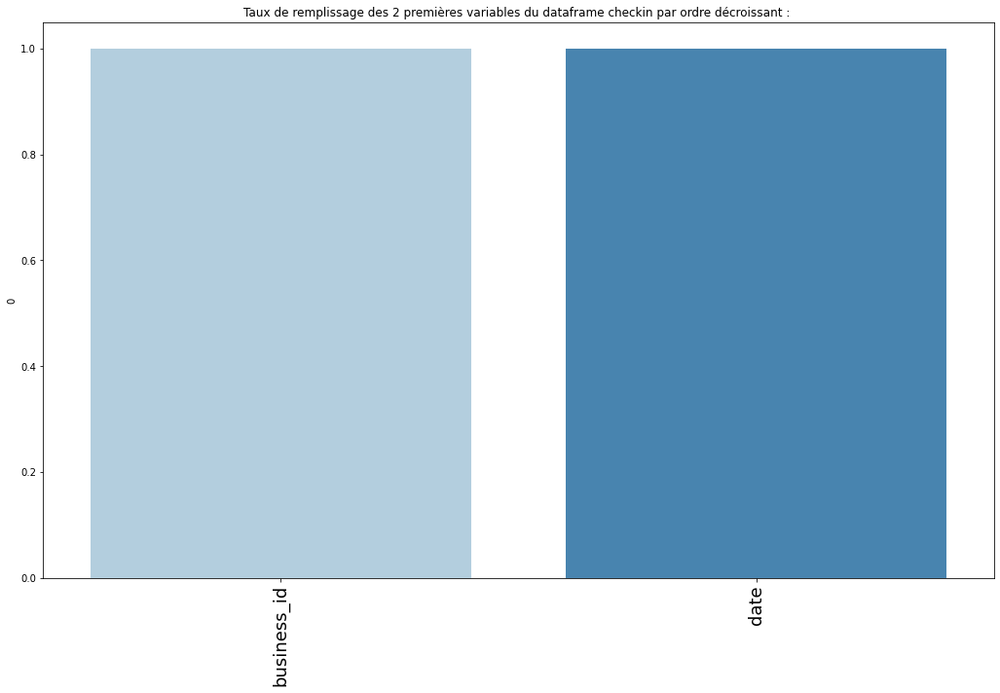


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------


                                   INFORMATIONS DE BASE SUR LE DATAFRAME :  REVIEW


Dimensions du dataframe : (4010561, 9)

Types de données contenues:
         n_features
object            5
int64             3
float64           1

Taux de remplissage des 9 premières variables par ordre décroissant :

               0
review_id    1.0
user_id      1.0
business_id  1.0
stars        1.0
useful       1.0
funny        1.0
cool         1.0
text         1.0
date         1.0

---------------------------------------------------

,review_id,user_id,business_id,text,date
count,4010561,4010561,4010561,4010561,4010561
unique,4010561,1336396,203172,4004896,3968058
top,3t-RDgFE_lIz2aBth6Zbxg,CxDOIDnH8gp9KXzpBHJYXw,RESDUcs7fIiihp38-d6_6g,Went in to pay off a loan via shared branching...,2014-05-29 18:26:42
freq,1,2222,5249,10,5



--------------------------------------------------------------------------------------------------------------------
                             TABLEAU DESCRIPTIF DES VARIABLES NUMERIQUES DU DATAFRAME REVIEW 
--------------------------------------------------------------------------------------------------------------------



,stars,useful,funny,cool
count,4.010561e+06,4.010561e+06,4.010561e+06,4.010561e+06
mean,3.702879e+00,1.324194e+00,4.601424e-01,5.757718e-01
std,1.490842e+00,3.553355e+00,2.170004e+00,2.483611e+00
min,1.000000e+00,-1.000000e+00,0.000000e+00,-1.000000e+00
25%,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,4.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,5.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
max,5.000000e+00,1.122000e+03,9.760000e+02,5.020000e+02



--------------------------------------------------------------------------------------------------------------------



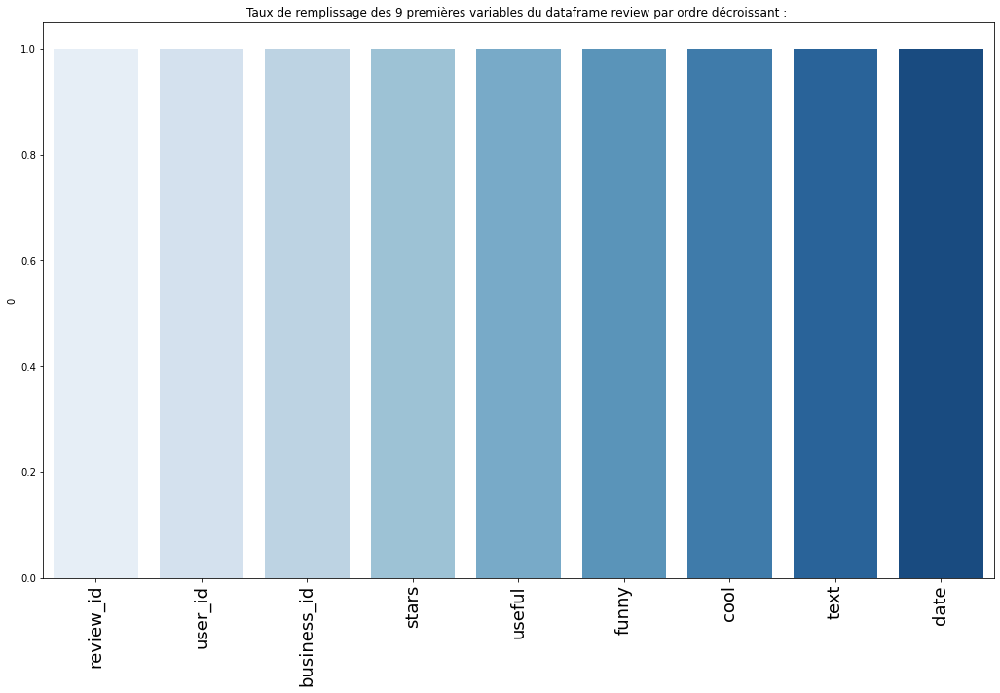


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------


                                   INFORMATIONS DE BASE SUR LE DATAFRAME :  TIP


Dimensions du dataframe : (660381, 5)

Types de données contenues:
        n_features
object           4
int64            1

Taux de remplissage des 5 premières variables par ordre décroissant :

                    0
user_id           1.0
business_id       1.0
text              1.0
date              1.0
compliment_count  1.0

--------------------------------------------------------------------------------------------------------------------

,user_id,business_id,text,date
count,660381,660381,660381,660381
unique,236241,105071,623839,659218
top,mkbx55W8B8aPLgDqex7qgg,FaHADZARwnY4yvlvpnsfGA,Love this place!,2015-04-16 11:46:42
freq,1330,1860,400,3



--------------------------------------------------------------------------------------------------------------------
                             TABLEAU DESCRIPTIF DES VARIABLES NUMERIQUES DU DATAFRAME TIP 
--------------------------------------------------------------------------------------------------------------------



,compliment_count
count,660381.000000
mean,0.015874
std,0.144121
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,15.000000



--------------------------------------------------------------------------------------------------------------------



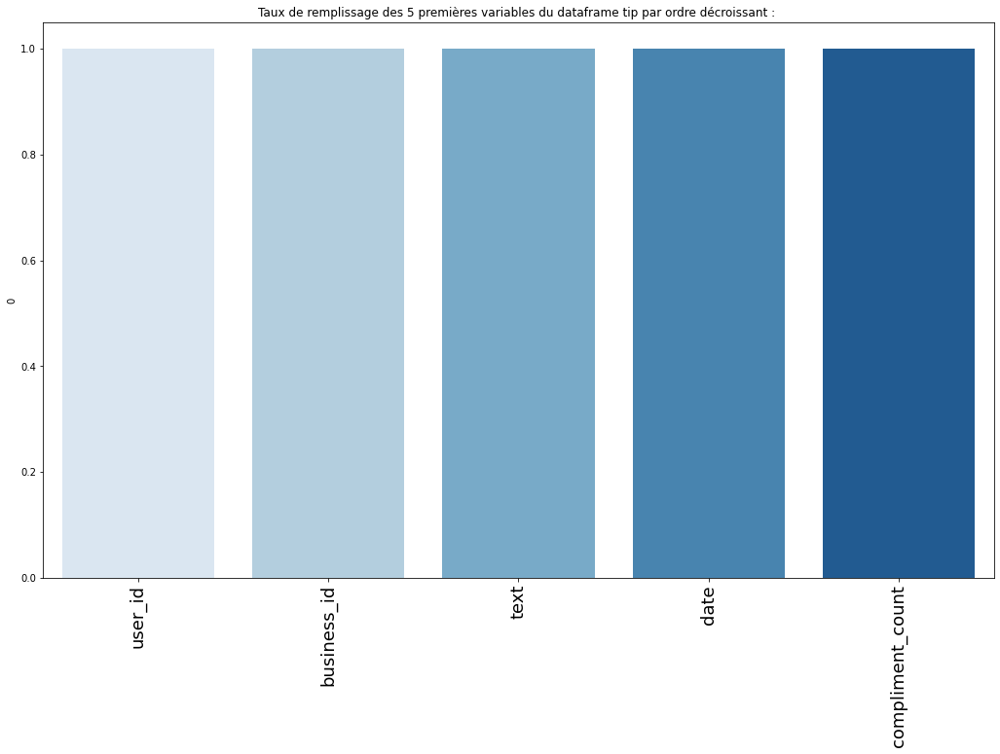


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------


                                   INFORMATIONS DE BASE SUR LE DATAFRAME :  USER


Dimensions du dataframe : (984352, 22)

Types de données contenues:
         n_features
int64            16
object            5
float64           1

Taux de remplissage des 22 premières variables par ordre décroissant :

                      0
user_id             1.0
compliment_funny    1.0
compliment_cool     1.0
compliment_plain    1.0
compliment_note     1.0
compliment_list     1.0
compliment_cute     1.0
compliment_profile  1.0
complim

,user_id,user_name,yelping_since,elite,friends
count,984352,984352,984352,984352,984352
unique,984352,87963,982281,559,560412
top,qsn-oYAS_ZnEnVtW7IRksA,John,2015-07-08 19:54:54,,None
freq,1,8469,3,946534,417845



--------------------------------------------------------------------------------------------------------------------
                             TABLEAU DESCRIPTIF DES VARIABLES NUMERIQUES DU DATAFRAME USER 
--------------------------------------------------------------------------------------------------------------------



,review_count,useful,funny,cool,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
count,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000,984352.000000
mean,22.164969,40.099256,17.165665,21.970786,1.458435,3.649338,1.917562,0.296567,0.187292,0.153844,0.065698,1.376622,2.830912,2.796363,2.796363,1.060107,1.100478
std,76.423168,523.555795,360.501070,454.849742,18.350290,1.171526,71.448040,9.426813,13.717173,7.154738,5.202423,66.831365,106.088862,88.946985,88.946985,32.269335,81.720573
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.000000,3.000000,0.000000,0.000000,0.000000,3.880000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,15.000000,13.000000,3.000000,3.000000,0.000000,4.570000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,12487.000000,145838.000000,135459.000000,139117.000000,11568.000000,5.000000,25452.000000,4102.000000,6711.000000,2912.000000,2461.000000,58480.000000,72370.000000,40508.000000,40508.000000,13955.000000,50823.000000



--------------------------------------------------------------------------------------------------------------------



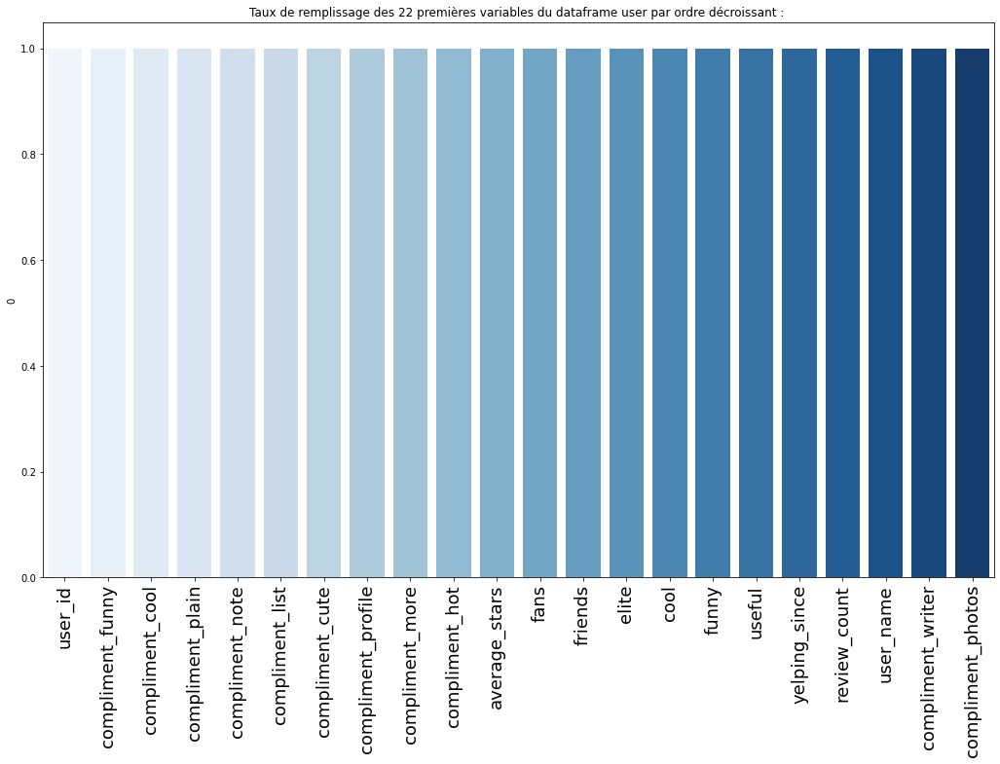


--------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------



In [8]:
for name, df in df_space.items():
    df.name = name
    detailed_info(df)

<a id='partie_22'></a><br><br><br>
### 1-2 Analyses exploratoires complémentaires : 

##### Analyse complémentaire du df Business : 
<br>
D'abord le boxplot des variables continues : 

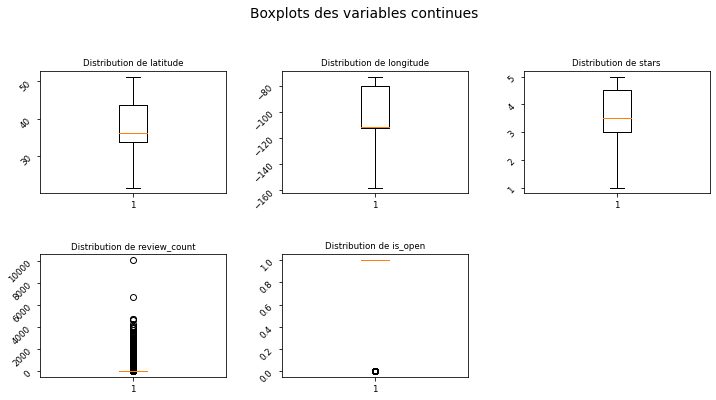

In [9]:
boxes(df_space['business'])

Pour aller un peu plus loin, on regarder les valeurs que prend la variable attributes : 

In [10]:
df_space['business'].attributes.value_counts()

TypeError: unhashable type: 'dict'

Exception ignored in: 'pandas._libs.index.IndexEngine._call_map_locations'
Traceback (most recent call last):
  File "pandas\_libs\hashtable_class_helper.pxi", line 4588, in pandas._libs.hashtable.PyObjectHashTable.map_locations
TypeError: unhashable type: 'dict'


{'BusinessAcceptsCreditCards': 'True'}                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

Puis celles que prend la variable categories : 

In [11]:
df_space['business'].categories.value_counts().head(50)

Nail Salons, Beauty & Spas                            546
Restaurants, Pizza                                    509
Beauty & Spas, Nail Salons                            505
Pizza, Restaurants                                    505
Food, Coffee & Tea                                    493
Coffee & Tea, Food                                    474
Mexican, Restaurants                                  454
Hair Salons, Beauty & Spas                            443
Restaurants, Mexican                                  441
Restaurants, Chinese                                  441
Chinese, Restaurants                                  419
Beauty & Spas, Hair Salons                            414
Auto Repair, Automotive                               299
Automotive, Auto Repair                               276
Financial Services, Banks & Credit Unions             260
Grocery, Food                                         259
Banks & Credit Unions, Financial Services             247
Food, Grocery 

Enfin voyons comment la variable hours est structurée et ce qu'elle contient : 

In [12]:
df_space['business'].hours.value_counts().head(50)

TypeError: unhashable type: 'dict'

Exception ignored in: 'pandas._libs.index.IndexEngine._call_map_locations'
Traceback (most recent call last):
  File "pandas\_libs\hashtable_class_helper.pxi", line 4588, in pandas._libs.hashtable.PyObjectHashTable.map_locations
TypeError: unhashable type: 'dict'


{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'Wednesday': '0:0-0:0', 'Thursday': '0:0-0:0', 'Friday': '0:0-0:0', 'Saturday': '0:0-0:0', 'Sunday': '0:0-0:0'}                  4520
{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', 'Wednesday': '8:0-17:0', 'Thursday': '8:0-17:0', 'Friday': '8:0-17:0'}                                                         1679
{'Monday': '9:0-17:0', 'Tuesday': '9:0-17:0', 'Wednesday': '9:0-17:0', 'Thursday': '9:0-17:0', 'Friday': '9:0-17:0'}                                                         1415
{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0', 'Wednesday': '11:0-22:0', 'Thursday': '11:0-22:0', 'Friday': '11:0-22:0', 'Saturday': '11:0-22:0', 'Sunday': '11:0-22:0'}     494
{'Monday': '10:0-21:0', 'Tuesday': '10:0-21:0', 'Wednesday': '10:0-21:0', 'Thursday': '10:0-21:0', 'Friday': '10:0-21:0', 'Saturday': '10:0-21:0', 'Sunday': '11:0-18:0'}     477
{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0', 'Wednesday': '11:0-22:0', 'Thursday': '11:0-22:0', 'Friday': '

Cette dernière ne nous sera pas d'une grande utilité pour le use case en cours.<br> 

### Analyse compémentaire du df user : 
<br><br>
On commence par l'analyse univariée : 

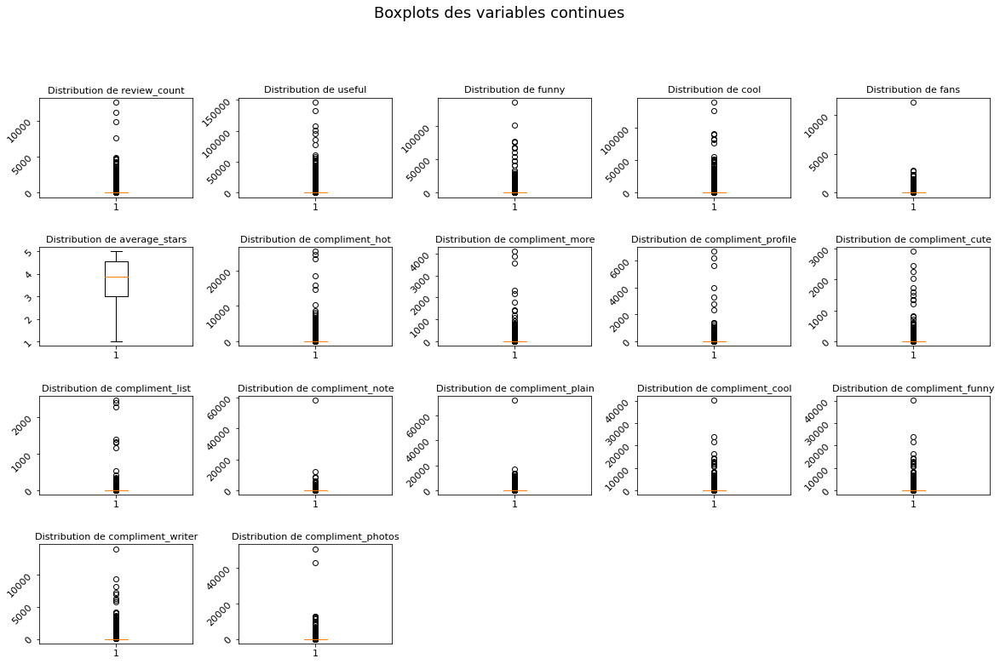

In [13]:
boxes(df_space['user'])

In [14]:
df_space['user'].elite.value_counts()

                                      946534
2018                                    5798
2017,2018                               5031
2016,2017,2018                          3226
2015,2016,2017,2018                     2385
                                       ...  
2008,2010,2012                             1
2008,2009,2010,2012,2013,2014,2016         1
2009,2010,2011,2012,2013,2017              1
2009,2010,2011,2012,2013,2014,2017         1
2007,2008,2010,2012,2013,2014,2015         1
Name: elite, Length: 559, dtype: int64

In [15]:
df_space['user'].friends.value_counts()

None                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

Toutes ces infos concernant les utilisateurs ne nous serviront pas non plus pour détecter les sujets d'insatisfaction, ni pour classifier des photos. 
<br><br>
#### Analyse complémentaire du df review

On commence par l'analyse univariée : 

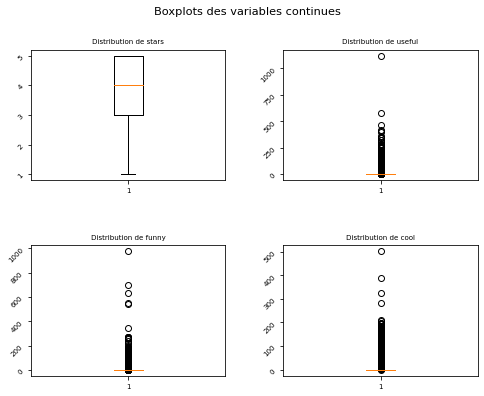

In [16]:
boxes(df_space['review'])

Ici, on trouve une variable "stars" qui semble être le rating général du business concerné. <br>
Et d'autres marques d'appréciation qui peuvent être intéressantes, mais comme on s'intéresse aux sujets d'insatisfaction, on n'utilisera pas ces dernières.<br>Voyons enfin notre variable text :  

In [17]:
df_space['review'].text

0          We stopped in on our way back to Tucson. We ha...
1          This hotel was loaded with history, plaques st...
2          Great gem which is quite tucked away. Fabulous...
3          Just in this past Friday evening we got seated...
4          Loved the food. This is a great place for stea...
                                 ...                        
4010556    Honestly I want to give 5 stars just for the n...
4010557    The buffet to end all buffets. and for $23!\nD...
4010558    Excellent taste, great quality for fast seafoo...
4010559    Went for lunch. We definitely should have been...
4010560    Food was very good, and their margaritas are y...
Name: text, Length: 4010561, dtype: object

C'est là dessus qu'on va travailler pour détecter les sujets d'insatisfaction. <br>
On va traiter uniquement les restaurants, c'est à dire : 

In [18]:
df_space['business'].loc[df_space['business'].index[
    df_space['business'].categories.str.contains('estaurant').fillna(False)], :]

,business_id,business_name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,J3_FTjy9LAtTtoW_cLwPxg,CO,4201-D Park Rd,Charlotte,NC,28209,35.174959,-80.848742,4.0,439,1,"{'GoodForKids': 'True', 'RestaurantsAttire': '...","Korean, Vietnamese, Asian Fusion, Sushi Bars, ...","{'Monday': '0:0-0:0', 'Tuesday': '11:0-22:0', ..."
1,qaa9M_pUfOv0BPRcnulk4g,Buraka Restaurant,1210 Williamson St,Madison,WI,53703,43.083644,-89.364268,3.5,81,1,"{'Ambience': '{'touristy': False, 'hipster': F...","Vegan, Vegetarian, African, Restaurants, Latin...","{'Monday': '11:0-2:0', 'Tuesday': '11:0-2:0', ..."
4,gimpD2HlgwC6maV7V43VEw,Le Gladstone,4114 Rue Sainte-Catherine O,Montréal,QC,H3G 1P2,45.487229,-73.586641,4.0,11,0,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...","French, Restaurants, Nightlife, Bars, Pubs","{'Monday': '0:0-0:0', 'Tuesday': '12:0-1:0', '..."
8,R7X6MGkwU6BfUTzglBiyRQ,Monical's Pizza,114 S Lombard St,Mahomet,IL,61853,40.192108,-88.400262,3.5,13,1,"{'RestaurantsTakeOut': 'True', 'OutdoorSeating...","Restaurants, Pizza, Italian, Sandwiches","{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'..."
9,3yb5khz4PCjiHI4ZbxfitA,Pizza Hut,"9333 E Apache Trl, Ste 101",Mesa,AZ,85207,33.414788,-111.629334,1.5,23,1,"{'Caters': 'False', 'RestaurantsReservations':...","Chicken Wings, Pizza, Italian, Restaurants","{'Monday': '10:30-0:0', 'Tuesday': '10:30-0:0'..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104683,xRbAlgd3UjNM1UO831a7hg,Mad G's Grill & Tavern,19 E Broadway Rd,Tempe,AZ,85282,33.407400,-111.939327,3.5,14,0,"{'RestaurantsReservations': 'False', 'Restaura...","Nightlife, Bars, American (Traditional), Ameri...",None
104684,_F1_05YYlvePzomZ_NFijA,To-ne Sushi,414 Queen Street W,Toronto,ON,M5V 2A7,43.648720,-79.397872,3.5,198,1,"{'RestaurantsPriceRange2': '2', 'RestaurantsTa...","Japanese, Sushi Bars, Restaurants, Asian Fusion","{'Monday': '11:30-23:0', 'Tuesday': '11:30-23:..."
104688,qYKrFRGMevtfozGeGo8YIg,The Queensway Rotisserie & Grill,1633 The Queensway,Etobicoke,ON,M8Z 1T8,43.616045,-79.545197,3.5,76,0,"{'WiFi': 'u'free'', 'Caters': 'True', 'BikePar...","Comfort Food, Restaurants, Chicken Wings, Barb...","{'Monday': '9:30-21:30', 'Tuesday': '8:0-22:0'..."
104689,ZKSivkZcnH-nfqcIS8PUWA,The Spice Room,8635 Keele Street,Concord,ON,L4K 2N1,43.822123,-79.504007,4.0,25,1,"{'GoodForKids': 'True', 'BusinessParking': '{'...","Restaurants, Indian, Buffets","{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'..."


In [19]:
keys = df_space['business'].loc[df_space['business'].index[
    df_space['business'].categories.str.contains('estaurant').fillna(False)],
                                'business_id']

On isole les reviews correspondant à des restaurants, et on a le df qui va nous servir de base pour 

In [20]:
restaurant_reviews = df_space['review'].loc[df_space['review'].index[
    df_space['review'].business_id.isin(keys)], :]

<a id='partie_23'></a><br><br>

### 1-3 Méthode à bas niveau : KMeans sur bag-of-stems "fait main"

On va quand même nettoyer le texte grâce aux outils ntlk, pas si primitif...<br>
Et avant tout, on ne retient que les reviews ayant généré un rating <3. <br>

In [21]:
debug = True

if debug:
    restaurant_reviews = restaurant_reviews[
        restaurant_reviews.stars < 3].sample(15000)
else:
    restaurant_reviews = restaurant_reviews[restaurant_reviews.stars<3]

In [22]:
restaurant_reviews.loc[restaurant_reviews.index.tolist()[0], 'text']

"Went with friends, not really sure what they ordered but their choice of food wasn't really for me. The dishes were fine but not the type of food I prefer. The food included - egg plant and tofu dish, intestines, a spicy meat,etc. \nThe service was quick but it wasn't a busy time that we went. Not sure if I would come again."

On commence par tokeniser nos commentaires : 

In [23]:
tokenizer = nltk.RegexpTokenizer(r'\w+')
restaurant_reviews.loc[:, 'tokens'] = restaurant_reviews.loc[
    :, 'text'].apply(lambda x: tokenizer.tokenize(x.lower()))

In [24]:
np.array(restaurant_reviews.loc[restaurant_reviews.index.tolist()[0], 'tokens'])

array(['went', 'with', 'friends', 'not', 'really', 'sure', 'what', 'they',
       'ordered', 'but', 'their', 'choice', 'of', 'food', 'wasn', 't',
       'really', 'for', 'me', 'the', 'dishes', 'were', 'fine', 'but',
       'not', 'the', 'type', 'of', 'food', 'i', 'prefer', 'the', 'food',
       'included', 'egg', 'plant', 'and', 'tofu', 'dish', 'intestines',
       'a', 'spicy', 'meat', 'etc', 'the', 'service', 'was', 'quick',
       'but', 'it', 'wasn', 't', 'a', 'busy', 'time', 'that', 'we',
       'went', 'not', 'sure', 'if', 'i', 'would', 'come', 'again'],
      dtype='<U10')

On met le dictionnaire des stopwords en anglais de nltk à jour, avant de les éliminer de nos tokens : 

In [25]:
from nltk.corpus import stopwords
# nltk.download('stopwords')

In [26]:
stop_words = set(stopwords.words('english'))

In [27]:
restaurant_reviews.loc[:, 'tokens'] = restaurant_reviews.loc[
    :, 'tokens'].apply(lambda x: [word for word in x if word not in stop_words])

In [28]:
np.array(restaurant_reviews.loc[restaurant_reviews.index.tolist()[0], 'tokens'])

array(['went', 'friends', 'really', 'sure', 'ordered', 'choice', 'food',
       'really', 'dishes', 'fine', 'type', 'food', 'prefer', 'food',
       'included', 'egg', 'plant', 'tofu', 'dish', 'intestines', 'spicy',
       'meat', 'etc', 'service', 'quick', 'busy', 'time', 'went', 'sure',
       'would', 'come'], dtype='<U10')

In [29]:
from nltk.stem.porter import PorterStemmer
stemmer = PorterStemmer()
restaurant_reviews.loc[:, 'tokens'] = restaurant_reviews.loc[
    :, 'tokens'].apply(lambda x: [stemmer.stem(word) for word in x])

In [30]:
np.array(restaurant_reviews.loc[restaurant_reviews.index.tolist()[0], 'tokens'])

array(['went', 'friend', 'realli', 'sure', 'order', 'choic', 'food',
       'realli', 'dish', 'fine', 'type', 'food', 'prefer', 'food',
       'includ', 'egg', 'plant', 'tofu', 'dish', 'intestin', 'spici',
       'meat', 'etc', 'servic', 'quick', 'busi', 'time', 'went', 'sure',
       'would', 'come'], dtype='<U8')

On crée notre dictionnaire : 

In [31]:
wordfreq = {}
for corpus in restaurant_reviews.loc[:, 'tokens']:
    for token in corpus:
        if token not in wordfreq.keys():
            wordfreq[token] = 1
        else:
            wordfreq[token] += 1

Voyons la taille de notre dictionnaire : 

In [32]:
len(wordfreq)

20421

C'est un peu gros, on va limiter la taille du vocabulaire de notre modèle. Voyons au passage les termes les plus fréquents : 

In [33]:
n_features = 1000
most_frequent = sorted(wordfreq, key=wordfreq.get, reverse=True)[:n_features]
word_counts = [wordfreq[i] for i in sorted(
    wordfreq, key=wordfreq.get, reverse=True)][:n_features]
word_counts = pd.concat([pd.Series(most_frequent),
                        pd.Series(word_counts)], axis=1)
word_counts = word_counts.rename(columns={0: 'word', 1: 'count'})

In [34]:
word_counts.head(20).transpose()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
word,food,order,place,time,like,servic,go,get,good,one,us,back,would,ask,wait,even,restaur,tabl,got,came
count,13931,12686,9082,7944,7750,7426,7388,7223,6781,6699,6256,6124,5885,5525,5051,4902,4642,4256,4249,4227


In [35]:
word_counts[20:40].transpose()

,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
word,come,minut,never,want,tri,tast,realli,said,eat,drink,look,chicken,manag,2,went,server,could,say,custom,make
count,4203,4098,3998,3889,3868,3584,3570,3555,3534,3414,3348,3297,3198,3063,3028,3010,2983,2967,2956,2915


In [36]:
def vectorize(tokens):
    corp_vec = []
    for word in most_frequent:
        corp_vec.append(tokens.count(word))
    return corp_vec


restaurant_reviews.loc[:, 'vector'
                      ] = restaurant_reviews.loc[:, 'tokens'].apply(vectorize)

In [37]:
restaurant_reviews['vector']

200455     [3, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, ...
3442988    [3, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
2081686    [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, ...
2445916    [1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ...
520501     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
                                 ...                        
3912050    [5, 4, 1, 1, 0, 1, 0, 0, 4, 0, 0, 0, 3, 2, 1, ...
1273657    [2, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, ...
3591146    [3, 3, 1, 1, 1, 4, 1, 0, 1, 0, 1, 1, 1, 1, 0, ...
2295155    [1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...
1431532    [0, 2, 1, 1, 0, 1, 0, 0, 0, 2, 0, 0, 1, 0, 1, ...
Name: vector, Length: 15000, dtype: object

In [38]:
bow_matrix = restaurant_reviews['vector'].apply(pd.Series)
bow_matrix = bow_matrix.rename(
    columns={i: most_frequent[i] for i in range(n_features)})
bow_matrix

,food,order,place,time,like,servic,go,get,good,one,...,pricey,finger,similar,truli,ketchup,desert,frequent,caesar,screw,donut
200455,3,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3442988,3,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2081686,0,0,1,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2445916,1,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
520501,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3912050,5,4,1,1,0,1,0,0,4,0,...,1,0,0,0,0,0,0,0,0,0
1273657,2,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3591146,3,3,1,1,1,4,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2295155,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Classification non supervisée des topics : 
On va maintenant effectuer le clustering de notre bag of words...On commence par reprendre la méthode du coude utilisée au projet précédent : 

<AxesSubplot:title={'center':'KMeans : somme des inerties intra-cluster vs nb topics\n bag-of-words et vectorisation basiques'}>

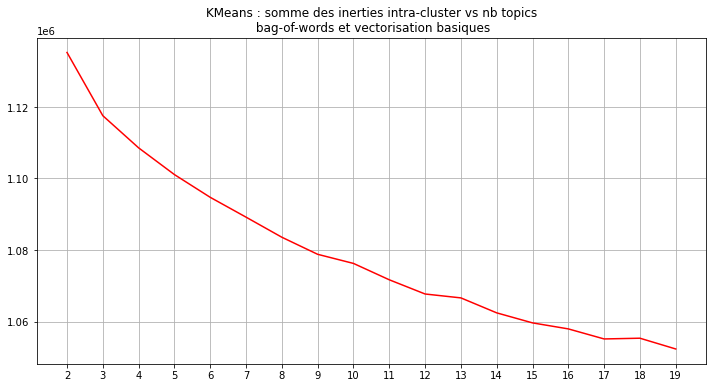

In [39]:
from sklearn.cluster import KMeans


def elbow_plot(df, start=2, end=20, step=1, title='Elbow-plot'):
    distorsions = []
    kas = np.arange(start, end, step)
    for k in kas:
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(df)
        distorsions.append(kmeans.inertia_)
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(111)
    ax.plot(kas, distorsions, color='r')
    ax.set_xticks(kas)
    ax.grid(True)
    ax.set_title(title)
    return ax


elbow_plot(bow_matrix, 2, 20,
           title='KMeans : somme des inerties intra-cluster vs nb topics\n bag-of-words et vectorisation basiques')

Ca fait beaucoup d'inertie même à 20 clusters, et on n'a pas vraiment de coude franc. 
Voyons si on peut faire mieux en résumant nos 1000 variables avec une ACP. 

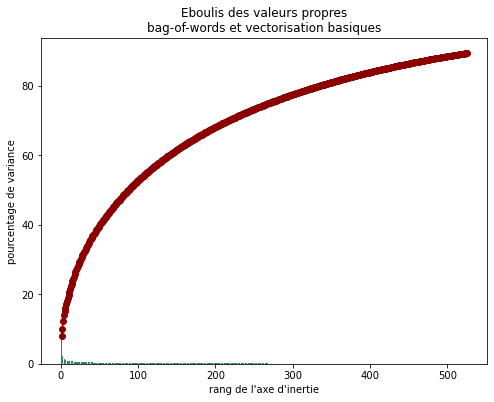

Les 525 composantes principales décrivent89.3157263690112 % de la variation totale du dataset


In [40]:
from sklearn.decomposition import PCA
n_comp = 525
pca = PCA(n_components=n_comp)
pca.fit(bow_matrix.values)


def screeplot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree, color='seagreen')
    plt.plot(np.arange(len(scree))+1, scree.cumsum(), c="darkred", marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage de variance")
    plt.title("Eboulis des valeurs propres\nbag-of-words et vectorisation basiques")
    plt.grid(b=False)
    plt.show(block=False)
    print(f'Les {n_comp} composantes principales décrivent' +
          f'{scree.sum()} % de la variation totale du dataset')


screeplot(pca)

<AxesSubplot:title={'center':'KMeans : somme des inerties intra-cluster vs nb topics\n bag-of-words et vectorisation basiques + ACP '}>

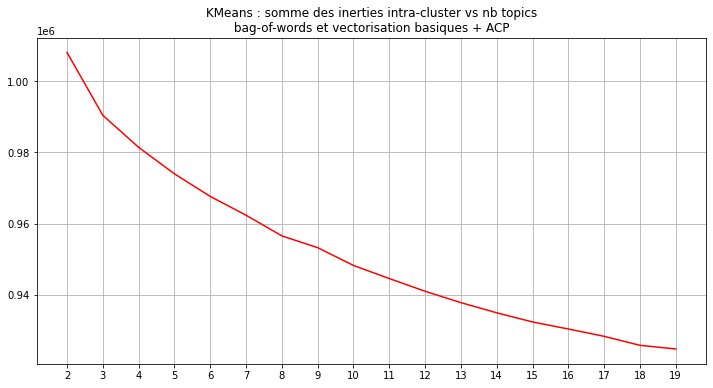

In [41]:
elbow_plot(pca.transform(bow_matrix), 2, 20,
           title='KMeans : somme des inerties intra-cluster vs nb topics\n bag-of-words et vectorisation basiques + ACP ')

On va la tenter en 8 clusters et voir quels top-words on obtient pour chaque topic : 

In [42]:
k = 8
kmeans = KMeans(n_clusters=k)
kmeans.fit(bow_matrix)

KMeans()

In [43]:
n_top_words = 12
centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
for i in range(k):
    print(f'Cluster {i}:' +
          f'  {[most_frequent[ind] for ind in centroids[i, :n_top_words]]}')

Cluster 0:  ['food', 'servic', 'place', 'order', 'good', 'go', 'time', 'like', 'get', 'back', 'one', 'would']
Cluster 1:  ['like', 'food', 'place', 'order', 'good', 'one', 'would', 'tast', 'get', 'go', 'restaur', 'realli']
Cluster 2:  ['order', 'food', 'us', 'ask', 'get', 'time', 'would', 'go', 'one', 'back', 'minut', 'wait']
Cluster 3:  ['us', 'food', 'tabl', 'ask', 'order', 'wait', 'time', 'minut', 'get', 'servic', 'came', 'back']
Cluster 4:  ['place', 'time', 'like', 'order', 'go', 'one', 'get', 'back', 'servic', 'good', 'would', 'ask']
Cluster 5:  ['food', 'place', 'servic', 'order', 'good', 'like', 'get', 'time', 'go', 'restaur', 'one', 'back']
Cluster 6:  ['order', 'time', 'food', 'get', 'place', 'go', 'one', 'pizza', 'ask', 'back', 'wait', 'servic']
Cluster 7:  ['room', 'hotel', 'get', 'stay', 'check', 'would', 'time', 'us', 'one', 'call', 'go', 'day']


Puis on visualise nos clusters sur un plan obtenu par tsne : 

In [44]:
import plotly
import plotly.express as px
from sklearn.manifold import TSNE
tsner = TSNE(perplexity=10)
bow_2d = pd.DataFrame(tsner.fit_transform(bow_matrix),
                      columns=['d1', 'd2'])
bow_2d.loc[:, 'cluster'] = kmeans.labels_.astype(str)
figue = px.scatter(bow_2d, x='d1', y='d2', color='cluster',
           title = "Visualisation en 2D des clusters identifiés par KMeans sur modèle basique de bag-of-words")
plotly.offline.iplot(figue)

<a id='partie_24'></a><br><br>

On observe déjà une séparation mais tous les clusters ne sont pas clairement séparés dans notre espace en 2d. 
Le vocabulaire limité y est peut être pour quelque chose. <br>
Sans normalisation, les termes les plus fréquents restent plus ou moins les mêmes et ne sont pas très informatifs ni très différenciants. <br>
Voyons si on peut faire mieux avec d'autres outils. 

### 1-4 Méthode et automatisation avancées : Scikit-learn vectorizers et ajustement du nombre de topics pour LDA
<br>On va maintenant utiliser les vectorizers de la famille scikitlearn, qui permettent d'effectuer toutes les opérations de pré-traitement en une fois. 

In [45]:
from sklearn.feature_extraction.text import CountVectorizer
trigram_vectorizer = CountVectorizer(ngram_range=(1, 3),
                                     token_pattern=r'\b[a-zA-Z]{4,}\b',
                                     max_features=10000,
                                     stop_words='english',
                                     strip_accents = 'unicode',
                                     min_df=5,
                                     max_df=0.5
                                     )
tg=trigram_vectorizer.fit_transform(restaurant_reviews.loc[:,'text'])
tg

<15000x10000 sparse matrix of type '<class 'numpy.int64'>'
	with 688233 stored elements in Compressed Sparse Row format>

In [46]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(**trigram_vectorizer.get_params())
tfidf_matrix = tfidf_vectorizer.fit_transform(restaurant_reviews.loc[:,'text'])

C:\Users\Wince\anaconda3\envs\P5\lib\site-packages\sklearn\feature_extraction\text.py:1796: UserWarning:

Only (<class 'numpy.float64'>, <class 'numpy.float32'>, <class 'numpy.float16'>) 'dtype' should be used. <class 'numpy.int64'> 'dtype' will be converted to np.float64.



In [47]:
from sklearn.decomposition import LatentDirichletAllocation


def lda_topics_curve(X, k_min, k_max, title='log-likelihood score vs n_topics'):
    perplexity_scores = {}
    log_likelihood_scores = {}
    for nt in range(k_min, k_max):
        lda = LatentDirichletAllocation(
            n_components=nt, max_iter=20,
            learning_method='online',
            learning_offset=50.)
        lda.fit(X)
        perplexity_scores[nt] = lda.perplexity(X)
        log_likelihood_scores[nt] = lda.score(X)
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111)  #211 si on trace aussi la courbe de perplexité
    ax.plot(log_likelihood_scores.keys(),
            log_likelihood_scores.values(),
            color='r')
    ax.grid(True)
    ax.set_title(title)
#     ax2 = fig.add_subplot(212)
#     ax2.plot(perplexity_scores.keys(), perplexity_scores.values(), color='r')
#     ax2.grid(True)
#     ax2.set_title('perplexity vs n_topics')
    return ax


# lda_topics_curve(tg, 2, 20, 'LDA log-likelihood score vs n_topics\nTrigrams')

In [48]:
# lda_topics_curve(tfidf_matrix, 2, 15, 'LDA log-likelihood score vs n_topics\nTrigrams + normalisation tf/idf')

Après différents essais et autant de résultats incohérents, il s'avère que la fonction de mesure a un bug (voir cas #6777 et #7992 sur le Github de ScikitLearn) et n'est fiable que lorsqu'elle travaille sur des monogrammes tf. 
On va donc choisir le meilleur nombre de topics en se basant sur un modèle simplifié, puis on utilisera le nombre de topics déterminé sur nos modèles plus élaborés. 

In [49]:
monogram_vectorizer = CountVectorizer(ngram_range=(1, 1),
                                     token_pattern=r'\b[a-zA-Z]{4,}\b',
                                     max_features=10000,
                                     stop_words='english',
                                     strip_accents = 'unicode',
                                     min_df=5,
                                     max_df=0.5
                                     )
mg=monogram_vectorizer.fit_transform(restaurant_reviews.loc[:,'text'])
mg

<15000x7818 sparse matrix of type '<class 'numpy.int64'>'
	with 576809 stored elements in Compressed Sparse Row format>

<AxesSubplot:title={'center':'LDA log-likelihood score vs n_topics\n monograms'}>

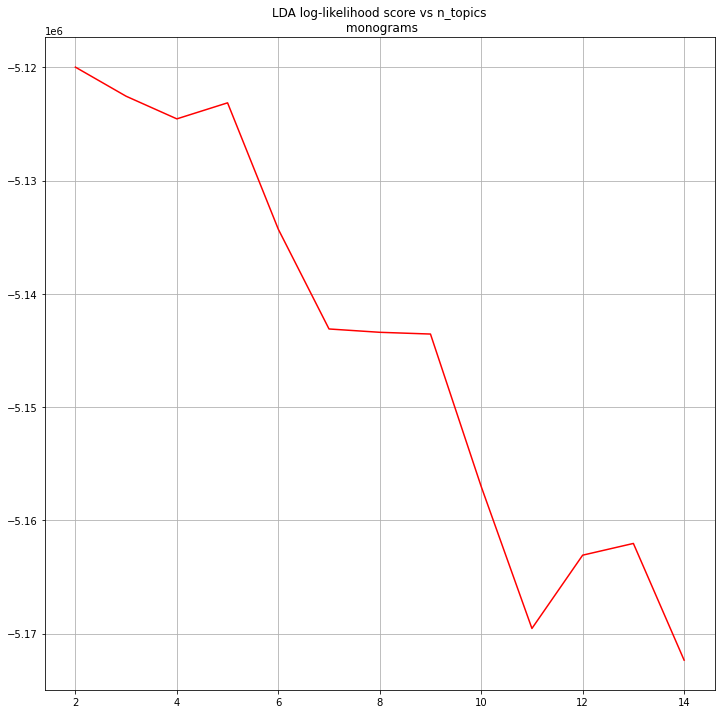

In [50]:
lda_topics_curve(mg, 2, 15, 'LDA log-likelihood score vs n_topics\n monograms')

In [51]:
n_topics = 5
lda = LatentDirichletAllocation(
        n_components=n_topics, max_iter=10,
        learning_method='online',
        learning_offset=50.)
lda.fit(tg)

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          n_components=5)

In [52]:
def display_topics(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic {}:".format(topic_idx))
        print(" ".join(
            [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
        )
             )


n_top_words = 15
display_topics(lda,{v:k for k,v in sorted(trigram_vectorizer.vocabulary_.items(), key=lambda x: x[1])}, n_top_words)

Topic 0:
time location ordered cold just breakfast order times restaurant quality place eggs experience menu used
Topic 1:
place like just room people really night time staff restaurant want good know going stay
Topic 2:
like chicken ordered good place just sauce salad pizza tasted taste really rice cheese didn
Topic 3:
good service place burger fries steak better great just beer really worth slow chips price
Topic 4:
order service minutes time asked said came table told just manager took didn server wait


<a id='partie_25'></a><br><br>

In [53]:
from IPython import display
import pyLDAvis
import pyLDAvis.sklearn

pyLDAvis.enable_notebook()
warnings.filterwarnings("ignore", category=DeprecationWarning)

### 1-5 Visualisation des différents modèles avec pyLDAvis: 

In [54]:
trigrams_prepared = pyLDAvis.sklearn.prepare(
    lda, tg, trigram_vectorizer)
pyLDAvis.display(trigrams_prepared)

Le tout implémenté sous forme de pipeline : 

In [55]:
from sklearn.pipeline import Pipeline


class StemmedCountVectorizer(CountVectorizer):
    def build_analyzer(self):
        analyzer = super(StemmedCountVectorizer, self).build_analyzer()
        return lambda doc: ([stemmer.stem(w) for w in analyzer(doc)])


stemmer_vectorizer = StemmedCountVectorizer(stop_words='english',
                                            ngram_range=(1, 3),
                                            token_pattern=r'\b[a-zA-Z]{4,}\b',
                                            max_features=10000,
                                            strip_accents = 'unicode', 
                                            max_df=0.5,
                                            min_df=5
                                            )

pipe_lda = LatentDirichletAllocation(
        n_components=n_topics, max_iter=10,
        learning_method='online',
        learning_offset=50.)
pipe_1 = Pipeline([('vectorize', stemmer_vectorizer),
                  ('LDA', pipe_lda)])
pipe_1.fit(restaurant_reviews.loc[:, 'text'])

Pipeline(steps=[('vectorize',
                 StemmedCountVectorizer(max_df=0.5, max_features=10000,
                                        min_df=5, ngram_range=(1, 3),
                                        stop_words='english',
                                        strip_accents='unicode',
                                        token_pattern='\\b[a-zA-Z]{4,}\\b')),
                ('LDA',
                 LatentDirichletAllocation(learning_method='online',
                                           learning_offset=50.0,
                                           n_components=5))])

In [56]:
pipeline_prepared = pyLDAvis.sklearn.prepare(
    pipe_1.steps[1][1],
    pipe_1.steps[0][1].transform(restaurant_reviews.loc[:, 'text']),
    pipe_1.steps[0][1])
pyLDAvis.display(pipeline_prepared)

<a id='partie_11'></a><br><br>

## Partie 2 - Traitement d'images : 

### 2-1 Brève analyse exploratoire des métadonnées : 

In [57]:
cd C:\\Users\\Wince\\Downloads\\OC\\Projet_6\\data

C:\Users\Wince\Downloads\OC\Projet_6\data


In [58]:
f = open(os. getcwd()+'\\yelp_photos\\photos.json')
img_meta = [json.loads(n) for n in f]
img_meta = pd.DataFrame(img_meta)
img_meta = img_meta.set_index('photo_id')
img_meta

,business_id,caption,label
photo_id,,,
001kKc6P_rmgaXThAHxEkw,zKZc8GwCaKbACaV0HZAmpg,Clean and simple interior,inside
002gqWfVal1D2DT6oA-bVQ,qnZzSC4TKen19Gz9nyKCvw,12oz. Boneless Ribeye | Grilled to perfection ...,food
002GtTSYyQ4swIZyEnfF5A,9km51KaQujxsSgdaG9gYSw,"The Most Yummy Tarts: Chantilly, Guava, Salted...",food
0036yehPJxVwNZDRDYH2jQ,Qg9L37JCd-PkcWMj9VAWmw,Dynamic Duo! Great dance music!,inside
003Isvt6NCJ567PdAEwrfA,zgQHtqX0gqMw1nlBZl2VnQ,,food
...,...,...,...
ZZZe7u0FOUIViEHdZyiLdQ,EkWxaYNt92DPjwXik7TbAQ,Honey Garlic Pizza,food
zZzjnzvMPoToXJpej1AI8w,xfCgxY_SQfzxFsQjNiLJEQ,I'm from LA and could not walk by wo stopping....,inside
ZZzMJaFD6f6DTUHEb23zxA,NtiBsNppXU0XS4zM89dphQ,STC TASTE MRKT - A new food experience,inside


In [59]:
img_meta.describe()

,business_id,caption,label
count,200000,200000,200000
unique,39830,72475,5
top,RESDUcs7fIiihp38-d6_6g,,food
freq,652,107420,118597


<br>Voyons les légendes les plus courantes pour nos photos : <br><br>

In [60]:
img_meta.caption.value_counts().head(50)

                                                                                    107420
Inside                                                                                 531
Interior                                                                               502
Menu                                                                                   311
McDonald's Quarter Pounder with Cheese Extra Value Meal                                297
McDonald's Snacks & Sides Menu Items                                                   286
McDonald's Buttermilk Crispy Chicken Sandwich Extra Value Meal                         284
McDonald's Dessert Menu Items                                                          281
McDonald's Artisan Grilled Chicken Sandwich Extra Value Meal                           280
McDonald's Double Cheeseburger Extra Value Meal                                        274
McDonald's All Day Breakfast Menu Items                                                257

<br>Et voyons la distribution des étiquettes : <br><br>

In [61]:
vc = img_meta.label.value_counts()
vc

food       118597
inside      53795
outside     13652
drink       12278
menu         1678
Name: label, dtype: int64

On a donc des étiquettes catégoriques concernant les photos qu'on va pouvoir utiliser pour entraîner un classifieur. En tout cas on va commencer par essayer une approche supervisée. 

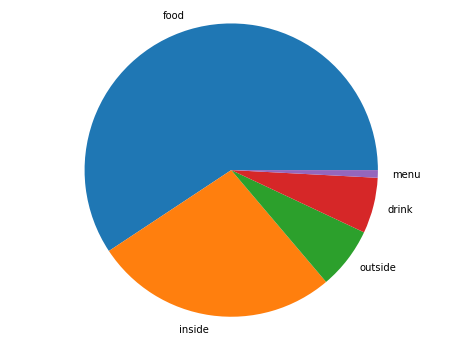

In [62]:
fig, ax = plt.subplots()
ax.pie(vc[:], labels=vc.index[:].tolist())
ax.axis('equal')
plt.show()

<a id='partie_12'></a><br><br>

### 2-2 Nettoyage : <br>
On nettoie l'index en retirant les noms commencant par un - , qui seraient générateurs d'erreurs : 

In [63]:
img_meta = img_meta.drop(
    index=img_meta.index[
        img_meta.index.str[0] == '-'])

On va ensuite générer des images de la classe "menu", qui sont très largement minoritaires. On va en générer 7 par fichier, soit un peu plus qu'il n'en faudrait pour équilibrer le dataset sur la base de la classe "drink". <br>Le code est visible ci dessous, mais ne sera pas exécuté. Par souci de fluidité on préfère utiliser un set d'images générées lors d'une exécution préalable : 

In [64]:
print('''from keras.preprocessing.image import ImageDataGenerator, array_to_img
from keras.preprocessing.image import img_to_array, load_img

datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

for n in img_meta[img_meta.label == 'menu'].index:
    img = load_img(wd+r'\\'+n + '.jpg')
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)
    i = 0
    for batch in datagen.flow(x, batch_size=1, save_to_dir='generated',
                              save_prefix=n, save_format='jpg'):
        i += 1
        if i > 6:
            break''')

from keras.preprocessing.image import ImageDataGenerator, array_to_img
from keras.preprocessing.image import img_to_array, load_img

datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

for n in img_meta[img_meta.label == 'menu'].index:
    img = load_img(wd+r'\'+n + '.jpg')
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)
    i = 0
    for batch in datagen.flow(x, batch_size=1, save_to_dir='generated',
                              save_prefix=n, save_format='jpg'):
        i += 1
        if i > 6:
            break


Ici on utilise les noms des fichiers générés pour remplir le df de métadonnées dont l'index servira de base pour l'adressage lors des différents traitements des fichiers : 

In [65]:
import regex as re

added = [f[:-4] for f in os.listdir('generated')]

for z in added:
    img_meta.loc[z, 'label'] = 'menu'
    img_meta.loc[z, ['business_id', 'caption']] = img_meta.loc[
        re.sub("_0_.*", '', z), ['business_id', 'caption']]
img_meta.tail(20)

,business_id,caption,label
photo_id,,,
_XPk-tlTv7KrWu43sBMq6Q_0_2814,_GLjUkVPjRmu6ASmQZbmyg,Menu and specials,menu
_XPk-tlTv7KrWu43sBMq6Q_0_5380,_GLjUkVPjRmu6ASmQZbmyg,Menu and specials,menu
_XPk-tlTv7KrWu43sBMq6Q_0_6297,_GLjUkVPjRmu6ASmQZbmyg,Menu and specials,menu
_XPk-tlTv7KrWu43sBMq6Q_0_7587,_GLjUkVPjRmu6ASmQZbmyg,Menu and specials,menu
_XPk-tlTv7KrWu43sBMq6Q_0_902,_GLjUkVPjRmu6ASmQZbmyg,Menu and specials,menu
_XPk-tlTv7KrWu43sBMq6Q_0_9179,_GLjUkVPjRmu6ASmQZbmyg,Menu and specials,menu
_xRxXK9jzGUGWFXFbDR8ig_0_1753,n2NRR4N-kmeDvhHJivHGkA,Happy hour specials,menu
_xRxXK9jzGUGWFXFbDR8ig_0_5788,n2NRR4N-kmeDvhHJivHGkA,Happy hour specials,menu
_xRxXK9jzGUGWFXFbDR8ig_0_7383,n2NRR4N-kmeDvhHJivHGkA,Happy hour specials,menu


In [66]:
img_meta.label.value_counts()

food       116821
inside      52964
outside     13433
menu        13205
drink       12090
Name: label, dtype: int64

On filtre nos données pour prendre uniquement des photos des businesses de la catégorie restaurant : 

In [67]:
resto_meta = img_meta[img_meta['business_id'].isin(
    df_space['business'][df_space['business'].categories.str.contains('estaurant').fillna(False)].business_id)
                                          ]
resto_meta

,business_id,caption,label
photo_id,,,
001kKc6P_rmgaXThAHxEkw,zKZc8GwCaKbACaV0HZAmpg,Clean and simple interior,inside
002gqWfVal1D2DT6oA-bVQ,qnZzSC4TKen19Gz9nyKCvw,12oz. Boneless Ribeye | Grilled to perfection ...,food
004a5VhdS6w9PaH0QmlX9g,NDu9ZhZkP1IxrEd-cST3rQ,Shrimp,food
007FeerwcQQRx7ck_xA0QA,nsNONDHbV7Vudqh21uicqw,Surf and turf with 1.5lb lobster and 7oz Filet...,food
00aHWjZkA25JE4A_g74clA,FglXSTFdlSM4WoCcEf01tw,,food
...,...,...,...
_YP1JaaKVFfZ5HWmn4RU_Q_0_7040,zWFuGjtmzekVBTL0muNsXw,Chicken Sandwiches,menu
_YP1JaaKVFfZ5HWmn4RU_Q_0_7100,zWFuGjtmzekVBTL0muNsXw,Chicken Sandwiches,menu
_YP1JaaKVFfZ5HWmn4RU_Q_0_8073,zWFuGjtmzekVBTL0muNsXw,Chicken Sandwiches,menu


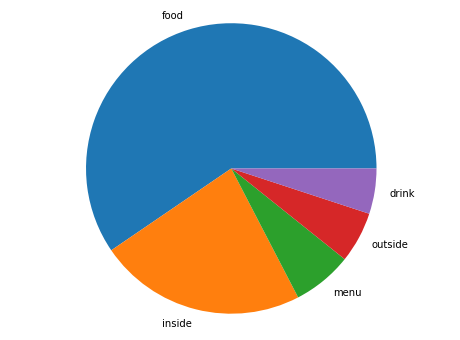

In [68]:
vc = resto_meta.label.value_counts()
fig, ax = plt.subplots()
ax.pie(vc[:], labels=vc.index[:].tolist())
ax.axis('equal')
plt.show()

Grâce à ces images, on va pouvoir créer un set d'images équilibré pour permettre un apprentissage équilibré des classes. 

In [69]:
from imblearn.under_sampling import RandomUnderSampler
undersampler = RandomUnderSampler(sampling_strategy='not minority')

In [70]:
undersampler.fit_resample(
    resto_meta[resto_meta.columns[resto_meta.columns != 'label']],
    resto_meta['label'])
img_meta = resto_meta.iloc[undersampler.sample_indices_, :]
img_meta

,business_id,caption,label
photo_id,,,
02gsqO6SQfesH8qcoZ7J8g,qE9yIXn2GQb2-4a_qOOKzg,,drink
02LI6iJ-NEEt9c8aHzZZDg,DMyoxEaTGTakZxWgh1D5bw,Our Wine Bar is pouring some of the most celeb...,drink
03C0pkVq5r9ikbZBPSxLcA,XkvvUNCmLIvOts0OftXegw,,drink
06zkDxNWgUjQelP9xg3rug,Q6cgDdRy8BCmw745WZJCxA,,drink
07vWXL7PEinRtZmqEIoGKA,kz7O0_o6WrDQk1Kl8dKeHQ,Shaken or stirred? MARTINI SOCIAL HOUR Reserva...,drink
...,...,...,...
j0NmknP-34SFhyFAF-131Q,g62SlImzhs6_1t-knPjd8w,04/14/18 Red Square,outside
sw8zAZXH7ukAyYT54s1qDA,s68jDt3gdVMTG5AfSiSLTQ,Hotel Exterior,outside
B_iAKvO9gVebD7c3ezHNqg,5Day_lf10DyvKk9tmKqjRA,,outside


In [71]:
# undersampler.fit_resample(
#     img_meta[img_meta.columns[img_meta.columns != 'label']],
#     img_meta['label'])
# img_meta = img_meta.iloc[undersampler.sample_indices_, :]
# img_meta

On a maintenant un tableau de métadonnées qui contient un jeu de photos équilibré du point de vue des labels. 
On va pouvoir charger les photos qui nous intéressent en ram afin de les traiter et de voir si on peut les étiqueter automatiquement. 
<br>Avant, on resample nos données pour avoir un nombre fixe d'images, cela facilitera le suivi de nos opérations de traitement. 

In [72]:
sample_size=6000 if debug else 40000
img_names = [x + '.jpg' for x in img_meta.sample(sample_size).index.tolist()]
img_names[:5]

['peE2au1SY5IN1tsRaQBjgA.jpg',
 'zXWJXv-IEbICH1tiyZnqRA.jpg',
 '80Kli5TMXmSyTh6SuZKgrw.jpg',
 'L7y_WfSJBQovKR3DCk0XaA.jpg',
 'wUj69mCHnroF_LbsJ_WTNw_0_2698.jpg']

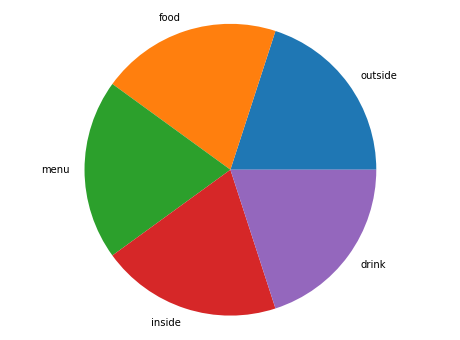

In [73]:
vc = img_meta.label.value_counts()
fig, ax = plt.subplots()
ax.pie(vc[:], labels=vc.index[:].tolist())
ax.axis('equal')
plt.show()

On crée notre galerie d'images : 

In [74]:
img_lib = {}
for n in img_names:
    if isfile(os.getcwd()+r'\\yelp_photos\\photos\\'+n):
        img_lib[n] = cv.imread((
            os.getcwd()+r'\\yelp_photos\\photos\\'+n)
        )
    elif isfile(os. getcwd()+r'\\generated\\'+n):
        img_lib[n] = cv.imread((os. getcwd()+r'\\generated\\'+n))
    else:
        print('C est pas ça...')

<a id='partie_13'></a><br><br>

### 2-3 Mode supervisé : fonctions de traitement et classification : 
#### 2-3-1 Création des transformateurs et du pipeline pour le Traitement et la classification des images : 

<br>On commence par encoder nos catégories et créer un jeu d'entrainement et un jeu de validation avec notre galerie d'images. 

In [75]:
y = pd.get_dummies(img_meta.loc[[x[:-4] for x in img_names], 'label'])

In [76]:
from sklearn.model_selection import train_test_split

img_lib, X_test, y_train, y_test = train_test_split(
    pd.Series(img_lib), y,
    test_size=0.2, random_state=42)

Puis on définit des fonctions de pré-traitement qu'on va mettre sous forme de pipeline en utilisant la classe Function_transformer. 
D'abord pour un traitement en couleurs avec ORB. 

In [77]:
from sklearn.preprocessing import FunctionTransformer


def preprocessing(lib):
    img_library = {}
    for n in lib.index:
        img_library[n] = cv.resize(lib[n], (288, 288))
        img_library[n] = cv.GaussianBlur(img_library[n], (3, 3), 0)
        img_library[n] = cv.cvtColor(img_library[n], cv.COLOR_BGR2HSV)
        img_library[n][:, :, 2] = cv.equalizeHist(img_library[n][:, :, 2])
        img_library[n] = cv.cvtColor(img_library[n], cv.COLOR_HSV2BGR)
    return img_library


preprocessor = FunctionTransformer(preprocessing)

Voici les transformations successives que va subir chacune des images traités par cette fonction (à ceci près qu'on démontre le traitement en RGB pour visionner avec matplotlib, au lieu de traiter des images en BGR comme chez openCV) : 

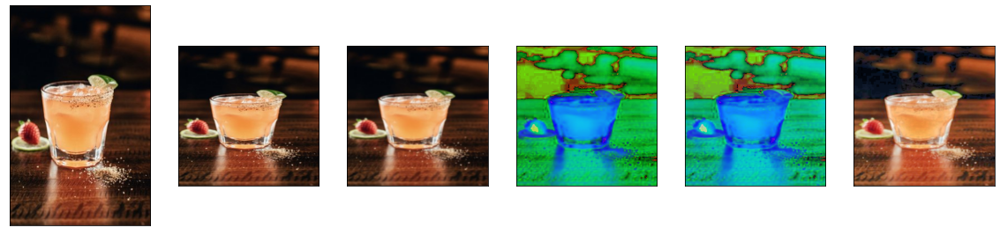

In [78]:
columns = 6
image = img_lib[random.choice(img_lib.index)][..., ::-1]
fig = plt.figure(figsize=(20,8))
fig.add_subplot(1, 6, 1)
plt.imshow(image)
fig.add_subplot(1, 6, 2)
image = cv.resize(image,(288, 288))
plt.imshow(image)
fig.add_subplot(1, 6, 3)
image = cv.GaussianBlur(image, (3, 3), 0)
plt.imshow(image)
fig.add_subplot(1, 6, 4)
image = cv.cvtColor(image, cv.COLOR_RGB2HSV)
plt.imshow(image)
fig.add_subplot(1, 6, 5)
image[:, :, 2] = cv.equalizeHist(image[:, :, 2])
plt.imshow(image)
fig.add_subplot(1, 6, 6)
image = cv.cvtColor(image, cv.COLOR_HSV2RGB)
plt.imshow(image)
for ax in fig.axes:
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.show()

On fait la même chose pour l'extraction de features via ORB, mais cette fois on va intégrer les fonctions de détections de features sous forme de méthodes fit et predict appartenant à une sous-classe de transformermixin (la classe de base des transformateurs scikit-learn). 

In [79]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans


class Orb_Featurizer(BaseEstimator, TransformerMixin):
    def __init__(self, n_features=200):
        self.n_features = n_features
        self.kmeans = KMeans(n_clusters=n_features)
        self.orb = cv.ORB_create()

    def fit(self, img_lib, y=None):
        bof = []
        for n in img_lib.keys():
            kp, desc = self.orb.detectAndCompute(img_lib[n], None)
            for d in desc:
                bof.append(d)
        self.kmeans.fit(bof)
        return self

    def transform(self, img_lib):
        counts = []
        for n in img_lib.keys():
            kp, desc = self.orb.detectAndCompute(img_lib[n], None)
            hist = np.zeros(self.n_features)
            for d in desc:
                ind = self.kmeans.predict([d])
                hist[ind] += 1
            counts.append(hist)
        return np.array(counts)


orb_featurizer = Orb_Featurizer(200)

On définit également une fonction de pré-traitement et un détecteur de features avec SIFT. 

In [80]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline


def grayscale_preprocessing(lib):
    img_library = {}
    for n in lib.index:
        img_library[n] = cv.resize(lib[n], (288, 288))
        img_library[n] = cv.GaussianBlur(img_library[n], (3, 3), 0)
        img_library[n] = cv.cvtColor(img_library[n], cv.COLOR_BGR2GRAY)
        img_library[n] = cv.equalizeHist(img_library[n])
    return img_library

In [81]:
class Sift_Featurizer(BaseEstimator, TransformerMixin):
    def __init__(self, n_features=200):
        self.n_features = n_features
        self.kmeans = KMeans(n_clusters=n_features)
        self.sift = cv.SIFT_create()

    def fit(self, img_lib, y=None):
        bof = []
        for n in img_lib.keys():
            kp, desc = self.sift.detectAndCompute(img_lib[n], None)
            for d in desc:
                bof.append(d)
        self.kmeans.fit(bof)
        return self

    def transform(self, img_lib):
        counts = []
        for n in img_lib.keys():
            kp, desc = self.sift.detectAndCompute(img_lib[n], None)
            hist = np.zeros(self.n_features)
            for d in desc:
                ind = self.kmeans.predict([d])
                hist[ind] += 1
            counts.append(hist)
        return np.array(counts)


sift_featurizer = Sift_Featurizer(200)

Avant de tester nos modèles, on met en place un classifieur aléatoire qui sera notre baseline pour évaluer la capacité d'apprentissage de notre modèle 

In [82]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import roc_auc_score

testset_names = X_test.index.tolist()
y_true = pd.get_dummies(pd.Series([img_meta.loc[name[:-4], 'label'] for name in testset_names]))

dummy = DummyClassifier(strategy='stratified')
dummy.fit(img_lib,
         img_meta.loc[[n[:-4] for n in img_lib.index], 'label'])

y_labase = dummy.predict_proba(X_test)
labaseline = roc_auc_score(y_true, y_labase, average='weighted', multi_class='ovr')
print(f'baseline ROC_AUC:{labaseline}')

baseline ROC_AUC:0.487553377877814


<a id='partie_132'></a><br><br>

#### 2-3-2 Détection de features avec SIFT : 

In [83]:
grayscale_preprocessor = FunctionTransformer(grayscale_preprocessing)
rf = RandomForestClassifier(class_weight='balanced')
sift_pipe = Pipeline([('preprocess', grayscale_preprocessor),
                 ('detect_features', sift_featurizer),
                 ('classify', rf)])
sift_pipe.fit(img_lib,
         img_meta.loc[[n[:-4] for n in img_lib.index], 'label'])

Pipeline(steps=[('preprocess',
                 FunctionTransformer(func=<function grayscale_preprocessing at 0x000002408E87D160>)),
                ('detect_features', Sift_Featurizer()),
                ('classify', RandomForestClassifier(class_weight='balanced'))])

Visualisation sur un exemple du pré-traitement avant détection de features par SIFT : 

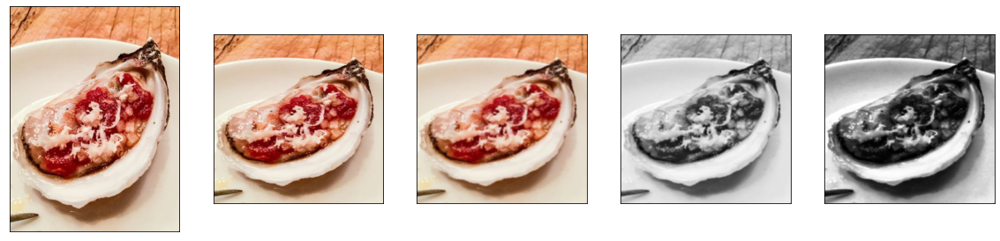

In [84]:
image = img_lib[random.choice(img_lib.index)][..., ::-1]
fig = plt.figure(figsize=(20,8))
fig.add_subplot(1, 5, 1)
plt.imshow(image)
fig.add_subplot(1, 5, 2)
image = cv.resize(image,(288, 288))
plt.imshow(image)
fig.add_subplot(1, 5, 3)
image = cv.GaussianBlur(image, (3, 3), 0)
plt.imshow(image)
fig.add_subplot(1, 5, 4)
image = cv.cvtColor(image, cv.COLOR_RGB2GRAY)
plt.imshow(image, cmap='gray')
fig.add_subplot(1, 5, 5)
image = cv.equalizeHist(image)
plt.imshow(image, cmap='gray')
for ax in fig.axes:
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.show()


<br>Faisons maintenant une prédiction sur le jeu de test avec notre pipeline juste entraîné : <br>

In [85]:
predictions = pd.DataFrame(index=testset_names)
predictions.loc[:, ['predicted']] = sift_pipe.predict(X_test).reshape(-1,1)
for name in testset_names:
    predictions.loc[name, 'actual'] = img_meta.loc[name[:-4], 'label']
predictions.head(10)

,predicted,actual
G_gRIOMW0_9srPZdVj_dTQ.jpg,outside,outside
1neDjc9yLoLMf2hvAVjJsQ.jpg,outside,outside
JgqCkHc2d_Ra6I9bJd0Gkw_0_6337.jpg,menu,menu
n057Af8Z6HdbHyBKB8o4jg.jpg,menu,outside
VDmzeQkVIhJ-BILiXqi2Qg.jpg,food,food
p-wgSX-9pUkTHlByOgMIng.jpg,food,food
oYbGI1AdpNRP61R-VzLIag.jpg,food,food
7Mz3dIzwYln6EHaB7B8yZw.jpg,drink,drink
BYU9IQxrzVVTPuDgOq0pQA.jpg,outside,outside
dLyijN8zaEWOwn1K0EgPQg.jpg,outside,outside


<br>Voyons la matrice de confusion des prédictions faites pour notre jeu de test : <br>

In [86]:
from sklearn.metrics import multilabel_confusion_matrix

mat = multilabel_confusion_matrix(predictions['predicted'],
                                  predictions['actual'],
                                  labels=img_meta.label.unique())
summary = pd.DataFrame([n.ravel() for n in mat], index=img_meta.label.unique(),
                       columns=['True Negative', 'False Positive',
                                'False Negative', 'True Positive'])
summary

,True Negative,False Positive,False Negative,True Positive
drink,887,92,74,147
food,866,67,95,172
inside,837,97,132,134
menu,888,39,61,212
outside,884,143,76,97


<br>Présenté de façon plus lisible (étiquettes prédites vs étiquettes réelles) : <br>

In [87]:
matrix = pd.get_dummies(predictions['predicted'])
predictions = pd.concat([predictions.actual, matrix], axis=1)
matrix = predictions.groupby('actual').sum()
matrix

,drink,food,inside,menu,outside
actual,,,,,
drink,147,40,24,18,10
food,28,172,29,4,6
inside,18,24,134,7,48
menu,5,7,15,212,12
outside,23,24,64,32,97


<br>Ou décrit avec un simple score à comparer avec notre baseline : <br>

In [88]:
y_true = pd.get_dummies(predictions.actual)
y_score = sift_pipe.predict_proba(X_test)
score = roc_auc_score(y_true,y_score, average='weighted', multi_class='ovr')
print(f'ROC_AUC du combo sift-kmeans200-random_forest : {score}')

ROC_AUC du combo sift-kmeans200-random_forest : 0.8859806445059191


<a id='partie_14'></a><br><br>

#### 2-3-3 Détection de features avec ORB : 

In [89]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

rf = RandomForestClassifier(class_weight='balanced')

pipe = Pipeline([('preprocess', preprocessor),
                 ('detect_features', orb_featurizer),
                 ('classify', rf)])

pipe.fit(img_lib,
         img_meta.loc[[n[:-4] for n in img_lib.index], 'label'])

Pipeline(steps=[('preprocess',
                 FunctionTransformer(func=<function preprocessing at 0x000002405AEF6160>)),
                ('detect_features', Orb_Featurizer()),
                ('classify', RandomForestClassifier(class_weight='balanced'))])

<br>On crée et fitte notre pipeline avec ORB de la même façon qu'avec SIFT puis on regarde les résultats obtenus en prédisant les classes de notre jeu de test : <br>

In [90]:
predictions = pd.DataFrame(index=testset_names)
predictions.loc[:, ['predicted']] = pipe.predict(X_test).reshape(-1,1)
for name in testset_names:
    predictions.loc[name, 'actual'] = img_meta.loc[name[:-4], 'label']
mat = multilabel_confusion_matrix(predictions['predicted'],
                                  predictions['actual'],
                                  labels=img_meta.label.unique())
summary = pd.DataFrame([n.ravel() for n in mat], index=img_meta.label.unique(),
                       columns=['True Negative', 'False Positive',
                                'False Negative', 'True Positive'])
matrix = pd.get_dummies(predictions['predicted'])
predictions = pd.concat([predictions.actual, matrix], axis=1)
matrix = predictions.groupby('actual').sum()
matrix

,drink,food,inside,menu,outside
actual,,,,,
drink,119,45,35,23,17
food,36,89,52,36,26
inside,24,60,87,30,30
menu,17,40,43,122,29
outside,28,45,60,55,52


In [91]:
y_score = pipe.predict_proba(X_test)
score = roc_auc_score(y_true,y_score, average='weighted', multi_class='ovr')

print(f'ROC_AUC du combo orb_couleur-kmeans200-random_forest : {score}')

ROC_AUC du combo orb_couleur-kmeans200-random_forest : 0.7064278488783733


<a id='partie_14'></a><br><br>



#### Récapitulatif et comparaison des pipelines testés : 

Différents essais ont été menés, avec 200 ou 500 features extraits, des images couleur et en nuances de gris, en détectant les features par SIFT et ORB. 
Ni la couleur ni le nombre de features ne semble apporter d'avantage dans l'efficacité du modèle. 
On garde donc pour le notebook livrable les modèles ORB et sift à 200 features, afin d'offrir un comparatif tout en gardant des temps d'exécution raisonnables. 

Différents classifieurs ont également été testés, on ne propose ici que le plus simple et efficace : RandomForest. 

<a id='partie_15'></a><br><br>

### 2-4 Classification non supervisée : extraction de features par VGG16 et classification par K Means

In [92]:
# img_lib[1].shape # pour vérification de l'intégrité des données images

#### 2-4-1 Extraction de features sans réentraînement : 
<br>On définit d'abord notre modèle d'extraction (on garde les poids Imagenet et on récupère l'output sur l'avant dernière couche vgg16)<br>

In [93]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import Model, Input

new_input = Input(shape=(224, 224, 3))
model = VGG16(weights="imagenet", input_tensor=new_input)
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

Puis on définit la fonction et le transformateur de preprocessing. 

In [94]:
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input


def vgg_preprocess(img_lib):
    img_cp = {}
    for name in img_lib.keys():
        img_cp[name] = cv.resize(img_lib[name], (224, 224))
        array = img_to_array(img_cp[name])
        reshaped = array.reshape((1, array.shape[0],
                                  array.shape[1], array.shape[2]))
        img_cp[name] = preprocess_input(reshaped)
    img_cp = pd.Series(img_cp.values(), index=img_cp.keys())
    return img_cp


vgg_preprocessor = FunctionTransformer(vgg_preprocess)

On l'exécute et on vérifie la forme de l'output : 

In [95]:
preprocessed_lib = vgg_preprocess(img_lib)

In [96]:
features = model.predict(preprocessed_lib[preprocessed_lib.index[0]])
print(features.shape)

(1, 4096)


<br>On définit une fonction d'extraction des features, qu'on exécute sur notre galerie d'images prétraitées.
<br>On vérifie la forme : 

In [97]:
def featurize(df, model=model):
    features_lib = pd.DataFrame(index=df.index, columns=range(4096))
    for n in df.index:
        features_lib.loc[n, :] = model.predict(df[n])
    return features_lib # retourne un df - dans la fonction ci-dessous, on retourne les valeurs pour chaîner les fonctions au sein du pipeline


def featurize_values(df, model=model):
    features_lib = pd.DataFrame(index=df.index, columns=range(4096))
    for n in df.index:
        features_lib.loc[n, :] = model.predict(df[n])
    return features_lib.values


features_lib = featurize(preprocessed_lib, model=model)
featurizer = FunctionTransformer(featurize_values)

In [98]:
features_lib.shape

(4800, 4096)

<br>On va maintenant réduire le nombre de variables, voyons si une PCA à 200 composantes donnerait un bon "résumé" de notre dataset : 

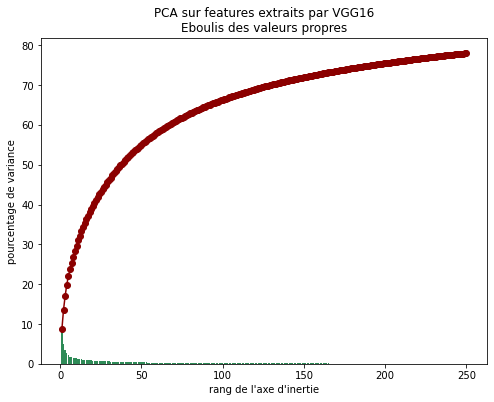

Les 250 composantes principales décrivent 78.0137439985884 % de la variation totale du dataset


In [99]:
from sklearn.decomposition import PCA
n_comp = 250
pca = PCA(n_components=n_comp)
pca.fit(features_lib.values)


def screeplot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree, color='seagreen')
    plt.plot(np.arange(len(scree))+1, scree.cumsum(), c="darkred", marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage de variance")
    plt.title("PCA sur features extraits par VGG16\nEboulis des valeurs propres")
    plt.grid(b=False)
    plt.show(block=False)
    print(f'Les {n_comp} composantes principales décrivent ' +
          f'{scree.sum()} % de la variation totale du dataset')


screeplot(pca)

Pas tout à fait...Pour simplifier, on va fitter notre pca automatiquement pour qu'elle soit représentative de 90% de la variance totale de notre bag of features

In [100]:
pca_auto = PCA(n_components=0.9, svd_solver='full')
pca_auto.fit(features_lib.values)

PCA(n_components=0.9, svd_solver='full')

<br>On couvre une proportion appréciable de la variance de notre jeu de features, on va donc garder notre PCA telle quelle. 
On va maintenant transformer nos données puis les regrouper en clusters à l'aide de KMeans. Voyons déjà quel serait le nombre de clusters le plus approprié : 

In [101]:
reduced_lib = pca_auto.transform(features_lib.values)

In [102]:
reduced_lib.shape

(4800, 764)

<AxesSubplot:title={'center':'KMeans : somme des inerties intra-cluster vs nb catégories\nYelp Photos, VGG16 + PCA'}>

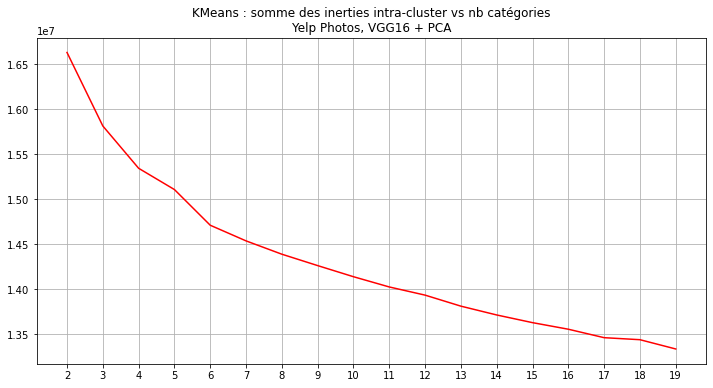

In [103]:
from sklearn.cluster import KMeans
def elbow_plot(df, start=2, end=20, step=1, title='Elbow-plot'):
    distorsions = []
    kas = np.arange(start, end, step)
    for k in kas:
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(df)
        distorsions.append(kmeans.inertia_)
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(111)
    ax.plot(kas, distorsions, color='r')
    ax.set_xticks(kas)
    ax.grid(True)
    ax.set_title(title)
    return ax

titre = ('KMeans : somme des inerties intra-cluster vs nb catégories\n'+'Yelp Photos, VGG16 + PCA')
elbow_plot(reduced_lib, 2, 20,
           title=titre)

On va donc garder 5 clusters dans notre segmentation. 
On définit maintenant le pipeline regroupant tous les traitements et aboutissant à la segmentation : 

In [104]:
transfer_kmeans = KMeans(5)

unsup_pipe = Pipeline([('preprocess', vgg_preprocessor),
                 ('detect_features', featurizer),
                 ('reduce_features', pca_auto),     
                 ('cluster', transfer_kmeans)])
unsup_pipe.fit(img_lib)
# transfer_kmeans.fit(reduced_lib)

Pipeline(steps=[('preprocess',
                 FunctionTransformer(func=<function vgg_preprocess at 0x00000241E0944F70>)),
                ('detect_features',
                 FunctionTransformer(func=<function featurize_values at 0x00000240B3C1BB80>)),
                ('reduce_features', PCA(n_components=0.9, svd_solver='full')),
                ('cluster', KMeans(n_clusters=5))])

#### Visualisation : 
<br><br>On va maintenant réduire nos features à 2 dimensions afin de créer un espace propice à la visualisation de nos clusters d'image : 

In [105]:
from sklearn.manifold import TSNE
tsner = TSNE(n_components=2, perplexity=15)
reduced_features = pd.DataFrame(tsner.fit_transform(reduced_lib),
                                columns=['d1', 'd2'])  # , 'd3'
reduced_features.loc[:, 'cluster'] = unsup_pipe.steps[-1][1].labels_.astype(str)

On se crée une galerie de miniatures en RGB pour la visualisation, et on va sélectionner aléatoirement quelques images parmi notre jeu d'entraînement : 

In [106]:
miniatures = {}
for name in img_lib.index:
    miniatures[name] = cv.resize(cv.cvtColor(
        img_lib[name], cv.COLOR_BGR2RGB), (50, 50))

In [107]:
n_examples_for_demo = 200
demo_sample = reduced_features.sample(n_examples_for_demo)
demo_mini = {n:miniatures[img_lib.index.tolist()[n]] for n in demo_sample.index.tolist()}
demo_sample.head()

,d1,d2,cluster
1679,27.538782,52.061073,3
1139,-43.544140,-37.271725,1
11,51.751953,-4.890601,2
1610,30.948910,-32.005627,2
3635,-3.961661,-46.137791,0


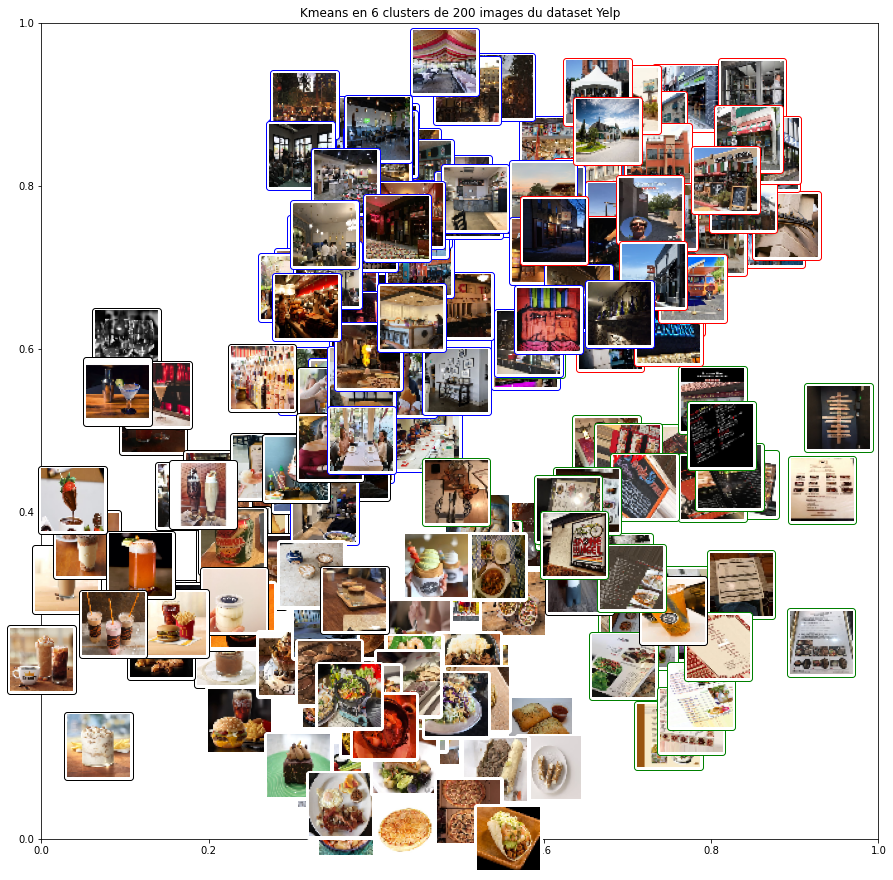

In [108]:
import matplotlib.image as image
from matplotlib import offsetbox


def plot_embedding(X, labels=None,mini=demo_mini, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (1.05 * (x_max - x_min))
    plt.figure(figsize=(15, 15))
    ax = plt.subplot(111)

    if hasattr(offsetbox, 'AnnotationBbox'):
        for n in mini.keys():
            if labels is None:
                props = {'boxstyle': 'round', 'edgecolor': 'white'}
            elif labels[n] == '0':
                props = {'boxstyle': 'round', 'edgecolor': 'white'}
            elif labels[n] == '1':
                props = {'boxstyle': 'round', 'edgecolor': 'black'}
            elif labels[n] == '2':
                props = {'boxstyle': 'round', 'edgecolor': 'green'}
            elif labels[n] == '3':
                props = {'boxstyle': 'round', 'edgecolor': 'red'}
            elif labels[n] == '4':
                props = {'boxstyle': 'round', 'edgecolor': 'blue'}
            elif labels[n] == '5':
                props = {'boxstyle': 'round', 'edgecolor': 'orange'}
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(
                    mini[n], cmap=plt.cm.gray, zoom=1.25),
                X.loc[n, ['d1', 'd2']], bboxprops=props)
            ax.add_artist(imagebox)
    if title is not None:
        plt.title(title)


plot_embedding(demo_sample.loc[:, ['d1', 'd2']],
               demo_sample.loc[:, 'cluster'],
               demo_mini,
               "Kmeans en 5 clusters de 200 images du dataset Yelp\nVGG16 sans ré-ebtraînement")

Voyons l'ARI de notre clustering par rapport aux étiquettes fournies : 

In [109]:
y_clust = unsup_pipe.predict(X_test)

In [110]:
from sklearn.metrics import adjusted_rand_score
clustering_score = adjusted_rand_score(predictions.actual, y_clust)
clustering_score

0.7198390396578156

In [111]:
y_clust

array([3, 3, 2, ..., 2, 4, 0])

<br>C'est un bon début, l'ARI est plus proche de 1 que de 0...Voyons par nous mêmes quelques photos de notre échantillon aléatoire classées par cluster prédit : 

<ipython-input-112-8762e2f81e7e>:17: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



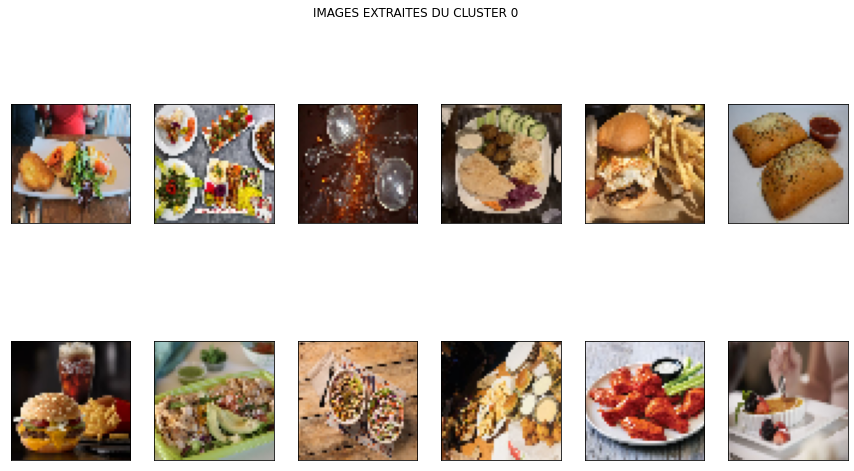

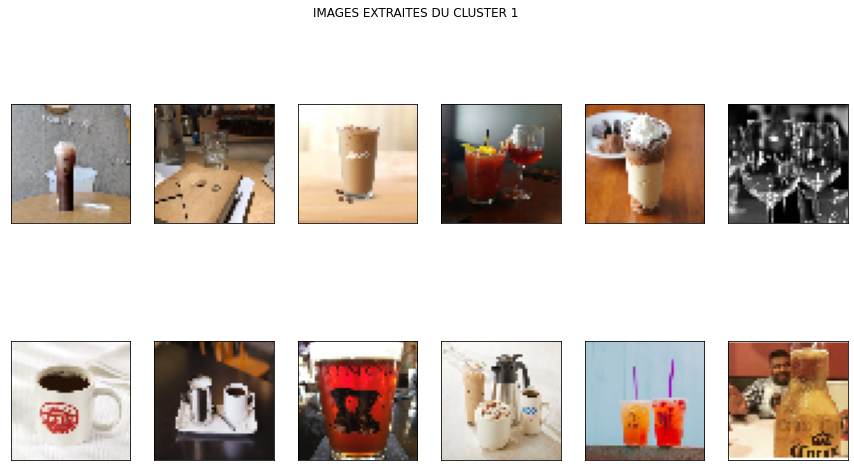

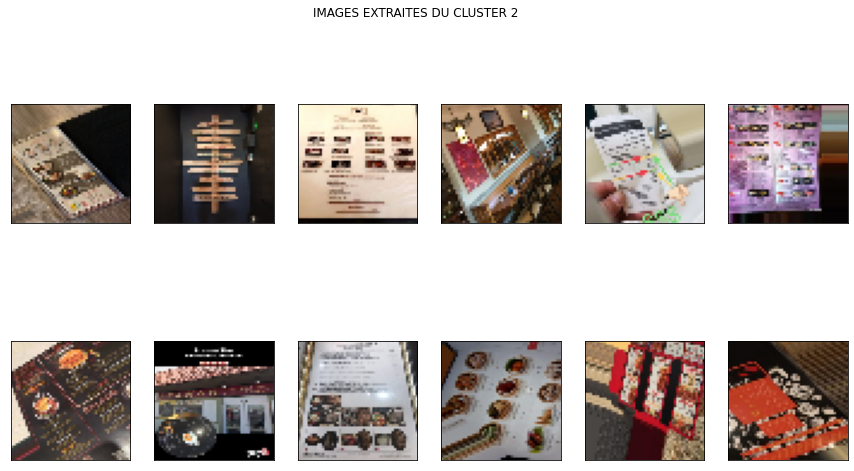

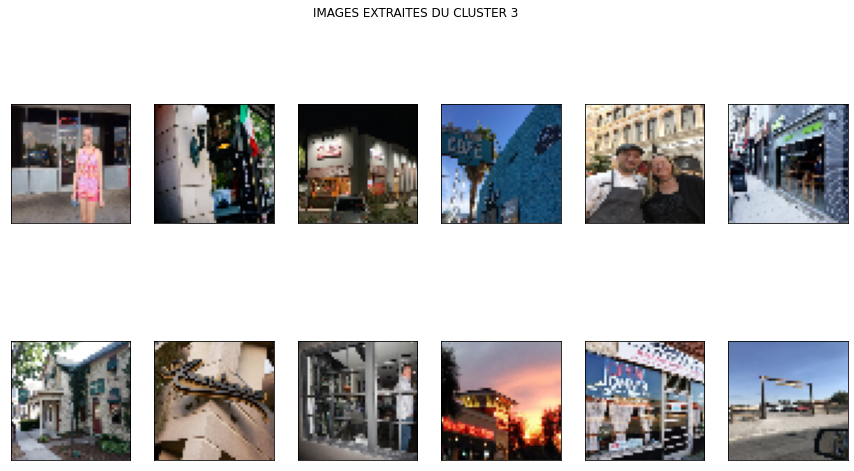

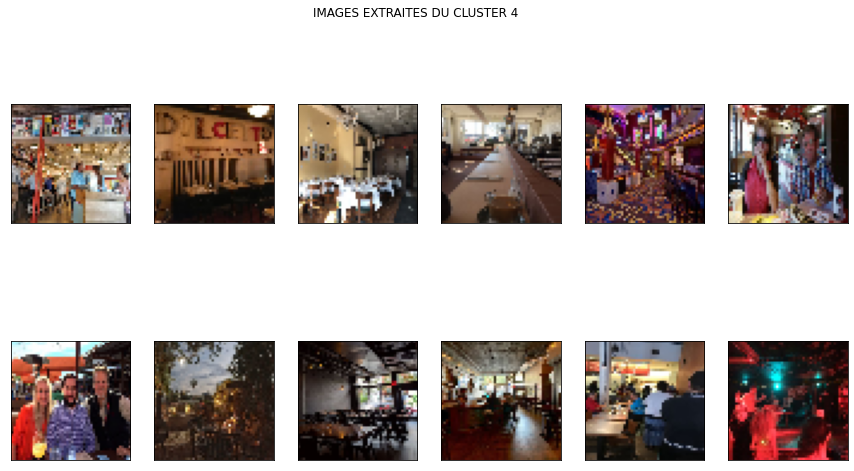

In [112]:

def display_image_clusters(demo_sample = demo_sample, demo_mini = demo_mini, columns = 6, rows = 2):
    figures = {}
    for n in range(len(demo_sample.cluster.unique())):
        figures[n]=plt.figure(figsize=(15, 8))
        keys = demo_sample[demo_sample.cluster == str(n)].index.tolist()
        images = []
        for key in keys:
            images.append(demo_mini[key])
        for i in range(1, columns*rows +1):
            image = images[i]
            axes = figures[n].add_subplot(rows, columns, i)
            plt.imshow(image)
        figures[n].suptitle(f'IMAGES EXTRAITES DU CLUSTER {n}')
        for ax in figures[n].axes:
            ax.xaxis.set_visible(False)
            ax.yaxis.set_visible(False)
        figures[n].show()
display_image_clusters(demo_sample, demo_mini, 6, 2)

C'a l'air plutôt bien...Mais refitter une couche de notre CNN pourrait sans doute améliorer sa performance. <br>

<a id='partie_16'></a><br><br>

#### 2-4-2 Fine tuning partiel : 
On va entraîner les dernières couches du réseau avec nos images et nos étiquettes catégoriques, avant de faire un clustering. 
D'abord, on reconstitue notre train d'étiquettes textuelles : 

In [113]:
fine_tuning_trainset = pd.DataFrame(columns=['filename','label'])
fine_tuning_trainset.loc[:,'filename'] = img_lib.index.tolist()
fine_tuning_trainset.loc[:,'label'] = img_meta.loc[[x[:-4] for x in img_lib.index.tolist()], 'label']
fine_tuning_trainset

,filename,label
0,KIDJ5fsFCtqC0m5j0n2LKA.jpg,NaN
1,tU2XemmAIBuckeKbhqixiw.jpg,NaN
2,SEp0qCHz9hskBbtxyoRGEg.jpg,NaN
3,HpQlrqTH2gf1lWvngG3aGQ.jpg,NaN
4,YUTCXg-Ip1ctGU2CR04sLg.jpg,NaN
...,...,...
4795,KaZ2dnQ0VaZHb4hTVeUmoA.jpg,NaN
4796,YhyXqJCiJvS7fnexkacyOg.jpg,NaN
4797,O5l9yMwJA6BrEjW0anpCtw.jpg,NaN
4798,CDjssjGD8jQ30nrTujF6Og.jpg,NaN


On adapte notre fonction de preprocessing, puis on l'exécute pour vérifier qu'on a bien les dimensions attendues : 

In [114]:
def vgg_preprocess(img_lib):
    img_cp = {}
    cp = np.empty([len(img_lib), 224, 224, 3])
    for i, name in enumerate(img_lib.keys()):
        img_cp[name] = cv.resize(img_lib[name], (224, 224))
        array = img_to_array(img_cp[name])
        reshaped = array.reshape((1, array.shape[0],
                                  array.shape[1], array.shape[2]))
        img_cp[name] = preprocess_input(reshaped)
        cp[i] = img_cp[name]
    # img_cp = pd.Series(img_cp.values(), index=img_cp.keys())
    return cp

vgg_preprocessor = FunctionTransformer(vgg_preprocess)

In [115]:
preprocessed_lib = vgg_preprocess(img_lib)

In [116]:
preprocessed_lib.shape

(4800, 224, 224, 3)

<br>On encode nos étiquettes textuelles en variable catégorique pour Keras et on construit notre modèle, dont on vérifie la constitution : 

In [117]:
from tensorflow.keras import utils as np_utils
from sklearn.preprocessing import LabelEncoder
label_encode = LabelEncoder()
y_train = img_meta.loc[[x[:-4] for x in img_lib.index.tolist()], 'label']
label_encode.fit(y_train)
y_train = label_encode.transform(y_train)
y_train = np_utils.to_categorical(y_train, num_classes=5)

In [118]:
from keras.applications.vgg16 import VGG16
from keras.layers import Dense
from keras import Model
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator

model = VGG16(weights="imagenet", input_shape=(224, 224, 3))

x = model.layers[-2].output

predictor = Dense(5, activation='softmax')(x)

new_model = Model(inputs=model.input, outputs=predictor)

for layer in new_model.layers:
    layer.trainable = False
for layer in new_model.layers[-2:]:
    layer.trainable = True

new_model.compile(loss="categorical_crossentropy", optimizer=optimizers.SGD(lr=0.0001, momentum=0.9), metrics=["accuracy"])

new_model.summary()


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

C:\Users\Wince\anaconda3\envs\P5\lib\site-packages\tensorflow\python\keras\optimizer_v2\optimizer_v2.py:374: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.



On fitte notre modèle puis on définit et on fitte notre pipeline : 

In [119]:
new_model.fit(preprocessed_lib, y_train,
              epochs=1, batch_size=None, verbose=0)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: invalid syntax (tmp9p0b4sjn.py, line 48)
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: invalid syntax (tmp9p0b4sjn.py, line 48)
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


In [120]:
def featurize_values(array, model=new_model):
    truncated_model = Model(inputs=model.input, outputs=model.layers[-2].output)
    features_lib = truncated_model.predict(array)
    return features_lib

featurizer = FunctionTransformer(featurize_values)

In [121]:
transfer_kmeans = KMeans(5)

unsup_pipe = Pipeline([('preprocess', vgg_preprocessor),
                 ('detect_features', featurizer),
                 ('reduce_features', pca_auto),     
                 ('cluster', transfer_kmeans)])
unsup_pipe.fit(img_lib)

Pipeline(steps=[('preprocess',
                 FunctionTransformer(func=<function vgg_preprocess at 0x0000024079107940>)),
                ('detect_features',
                 FunctionTransformer(func=<function featurize_values at 0x000002417AF85DC0>)),
                ('reduce_features', PCA(n_components=0.9, svd_solver='full')),
                ('cluster', KMeans(n_clusters=5))])

<br>On réduit encore notre espace par tSNE pour visualiser nos clusters sur 2 dimensions : 

In [122]:
reduced_lib = unsup_pipe[0:3].transform(img_lib)

In [123]:

from sklearn.manifold import TSNE
tsner = TSNE(n_components=2, perplexity=15)
reduced_features_2 = pd.DataFrame(tsner.fit_transform(reduced_lib),
                                columns=['d1', 'd2'])  # , 'd3'
reduced_features_2.loc[:, 'cluster'] = unsup_pipe.steps[-1][1].labels_.astype(str)

In [124]:
demo_sample_2 = reduced_features_2.sample(n_examples_for_demo)
demo_mini_2 = {n:miniatures[img_lib.index.tolist()[n]] for n in demo_sample_2.index.tolist()}
demo_sample_2

,d1,d2,cluster
257,9.935012,-47.628830,4
1798,-9.162412,-55.441830,4
2502,-62.488510,-33.016922,2
916,-37.122547,-4.896905,2
2682,-13.689616,-63.135952,4
...,...,...,...
81,49.455555,-22.345110,3
3314,-10.383767,12.151381,2
3986,-27.487015,7.304424,2
1528,-30.473087,29.886374,0


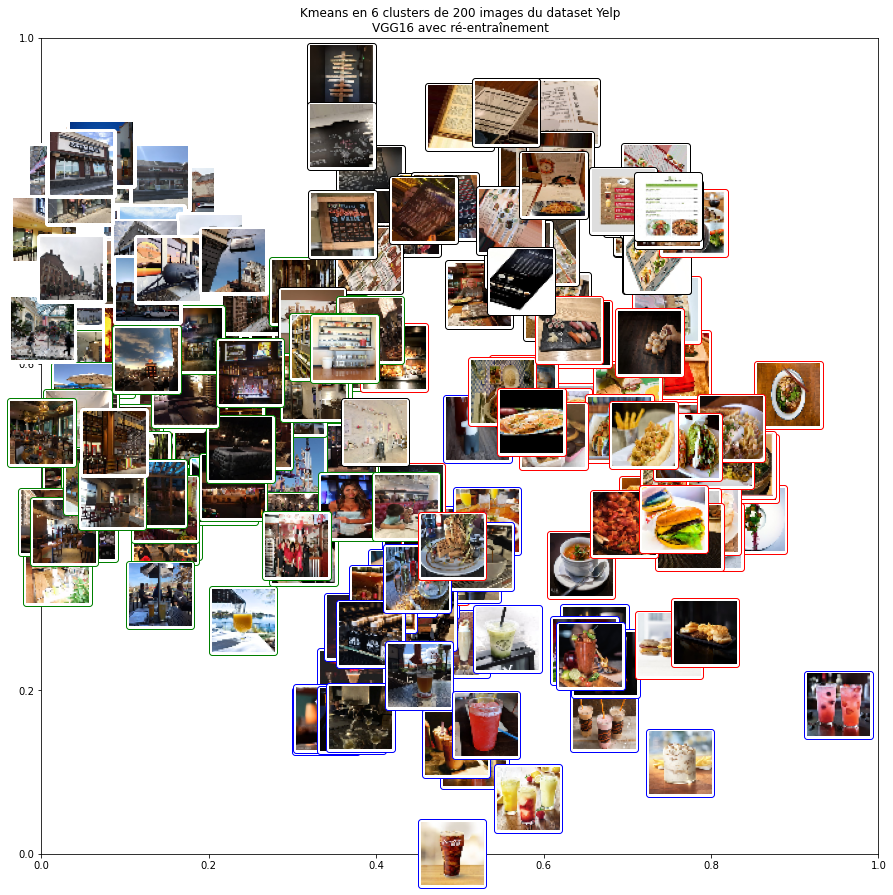

In [125]:
plot_embedding(demo_sample_2.loc[:, ['d1', 'd2']],
               demo_sample_2.loc[:, 'cluster'],
               demo_mini_2,
               "Kmeans en 5 clusters de 200 images du dataset Yelp\nVGG16 avec ré-entraînement")

<ipython-input-112-8762e2f81e7e>:17: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



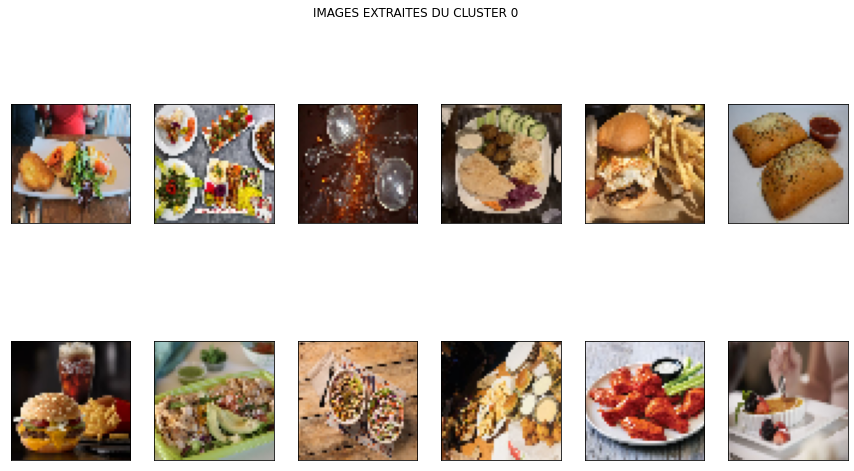

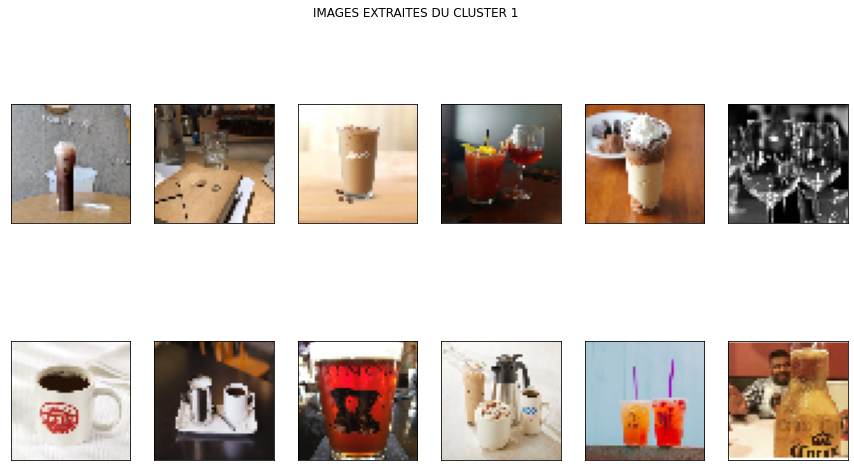

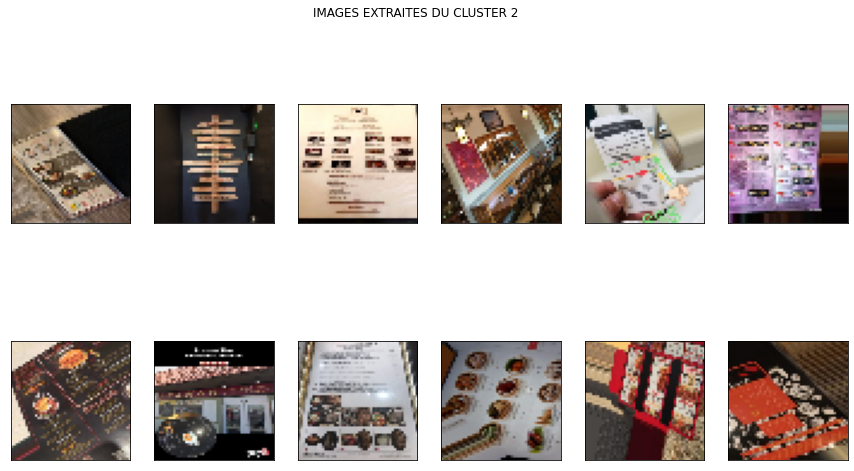

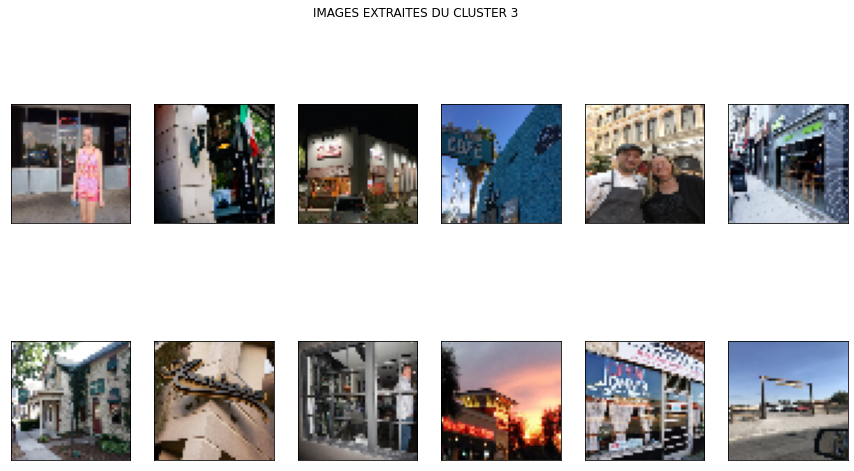

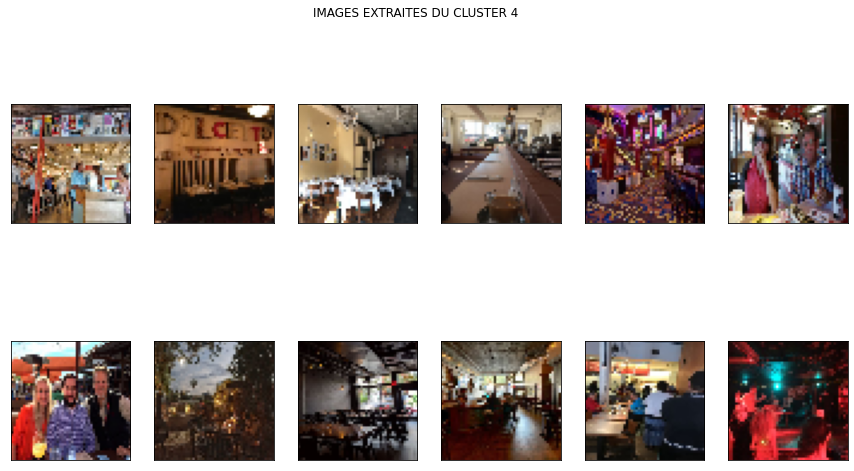

In [126]:
display_image_clusters(demo_sample, demo_mini, 6, 2)

<br> Faisons nos prédictions et voyons l'ARI de notre clustering par rapport aux étiquettes fournies : 

In [127]:
y_clust = unsup_pipe.predict(X_test)

In [128]:
testset_names = X_test.index.tolist()
predictions = pd.DataFrame(index=testset_names)
predictions.loc[:, ['predicted_cluster']] = y_clust.reshape(-1,1)
for name in testset_names:
    predictions.loc[name, 'actual'] = img_meta.loc[name[:-4], 'label']
predictions.head(10)

,predicted_cluster,actual
G_gRIOMW0_9srPZdVj_dTQ.jpg,0,outside
1neDjc9yLoLMf2hvAVjJsQ.jpg,0,outside
JgqCkHc2d_Ra6I9bJd0Gkw_0_6337.jpg,1,menu
n057Af8Z6HdbHyBKB8o4jg.jpg,0,outside
VDmzeQkVIhJ-BILiXqi2Qg.jpg,3,food
p-wgSX-9pUkTHlByOgMIng.jpg,4,food
oYbGI1AdpNRP61R-VzLIag.jpg,3,food
7Mz3dIzwYln6EHaB7B8yZw.jpg,4,drink
BYU9IQxrzVVTPuDgOq0pQA.jpg,2,outside
dLyijN8zaEWOwn1K0EgPQg.jpg,0,outside


In [129]:
from sklearn.metrics import adjusted_rand_score
clustering_score = adjusted_rand_score(predictions.actual, y_clust)
clustering_score

0.7395248930781966

<a id='partie_3'></a><br><br>

## Partie 3 : Récupération de données via l'API GraphQL Yelp 

On importe les librairies nécessaires, on adresse les clés d'API et le type d'objet transmis pour formuler la requête (ici json) en en-tête du message. On crée le transport (la librairie GraphQL formule les requêtes http à partir d'une URL, une en-tête, et d'autres paramètres optionnels) puis le client (la classe qui formule les requêtes à travers un transport préalablement défini), on formule notre requête selon la syntaxe expliquée dans le guide d'API Yelp, on exécute et on récupère la réponse. <br><br>
On fait d'abord une recherche des restaurants sur la ville de Vancouver (wa) en incluant les champs qui peuvent apporter des infos pertinentes pour notre application. <br>Voici à quoi ressemblent les données renvoyées : 

In [130]:
import requests, uuid, json
from gql import gql, Client
from gql.transport.requests import RequestsHTTPTransport


In [131]:
cd C:\\Users\\Wince\\Downloads\\OC\\Projet_6\\Data

C:\Users\Wince\Downloads\OC\Projet_6\Data


In [132]:
    # Creation des données de recherche
k=open("idl0pwl1.txt","r")
client_id = k.readline()
API_Key = k.readline()    
search_api_url = 'https://api.yelp.com/v3/graphql'
headers = {
    'Authorization': f'Bearer {API_Key}',
    'Content-Type': 'application/json'
}


In [133]:
transport = RequestsHTTPTransport(url=search_api_url, headers=headers, use_json=True)
client = Client(transport=transport, fetch_schema_from_transport=True)

In [134]:
query = gql('''{
    search(categories: "restaurant",
            location: "vancouver WA",
            limit: 50) {
        total
        business {
            name
            id
            rating
            photos            
        }
    }
}
''')

In [135]:
response = client.execute(query)

In [136]:
print(response['search']['total'])

2153


In [137]:
df = pd.DataFrame(response['search']['business'])
df.head(10)

,name,id,rating,photos
0,Thai Wok Kitchen,IMYh4LJm1ubY5Lw3rz-aqA,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/DTGvv...
1,I Heart Gyro,szJPyyYqJRxithtH6r6O9g,4.5,[https://s3-media3.fl.yelpcdn.com/bphoto/QtNH2...
2,Brewed Cafe & Pub,Prp0oy6V21P24bdvQ0Vhzw,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/853h9...
3,Abhiruchi Indian Cuisine South and North,jcykhIgB0cXLjSBkuet4WA,4.5,[https://s3-media2.fl.yelpcdn.com/bphoto/B7118...
4,Thai Champa,xeFke1EuoYXOZaX1rTQYEw,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/b7QQD...
5,Amaro's Table,g_BPftmJpuu2yEYaBS6yLQ,4.5,[https://s3-media2.fl.yelpcdn.com/bphoto/jxOOb...
6,Pine State Biscuits,5oed6H5F8qZxNzELq_1e1w,4.5,[https://s3-media3.fl.yelpcdn.com/bphoto/XUBi0...
7,Thai Orchid Restaurant,JkhXi-3RJtmUTlkjrSdWSw,4.0,[https://s3-media4.fl.yelpcdn.com/bphoto/Lm0mH...
8,River Maiden,x_V8wDr6Ws03Y5Yqg2n7jg,4.5,[https://s3-media3.fl.yelpcdn.com/bphoto/iTEzC...
9,Pip's Original Doughnuts & Chai,MVm6pgnnd6Sg_LdtUhkGuw,4.5,[https://s3-media3.fl.yelpcdn.com/bphoto/IOLkS...


<br>On définit maintenant une fonction en jouant sur le paramètre offset pour obtenir le nombre de restaurants désiré. 
Vérifions la taille du df obtenu : 

In [138]:
def business_search(category, location, n_businesses): 
    k=open("idl0pwl1.txt","r")
    client_id = k.readline()
    API_Key = k.readline()    
    search_api_url = 'https://api.yelp.com/v3/graphql'
    headers = {
        'Authorization': f'Bearer {API_Key}',
        'Content-Type': 'application/json'
    }

    transport = RequestsHTTPTransport(url=search_api_url, headers=headers, use_json=True)
    client = Client(transport=transport, fetch_schema_from_transport=True)
    df = pd.DataFrame()
    for n in range(math.ceil(n_businesses/50)):
        offset = 50 * n
        query_string = '''{
            search(categories: "''' + category + '''",
                    location: "''' + location + '''",
                    limit: 50, 
                    offset: ''' + str(offset) +''') {
                total
                business {
                    name
                    id
                    rating
                    photos            
                }
            }
        }
        '''
        query = gql(query_string)
        response = client.execute(query)
        df = df.append(pd.DataFrame(response['search']['business']), ignore_index=True)
    return df


tab = business_search('restaurant', 'vancouver WA', 200)
tab.shape

(200, 4)

<br>Maintenant qu'on a le nombre d'identifiants désirés pour notre test, il reste à formuler une requête à l'endpoint Reviews pour récupérer le texte et la note des reviews concernant ce business. 
<br>On agglomère le tout en un seul df : 

In [139]:
responses = pd.DataFrame(columns=['rating','text', 'id'])
for n in tab.id:
    query_string = '''{
        reviews(business: "''' + n + '''") {
            total
            review {
            rating
            text
            }
        }
    }
    '''
    query = gql(query_string)
    response = client.execute(query)
    df = pd.DataFrame(response['reviews']['review'])
    df.loc[:,'id'] = n
    responses = pd.concat([responses,df],ignore_index=True)

In [140]:
alldata = responses.merge(tab.rename(columns={'rating':'avg_stars'}), on='id', sort=False, validate = 'm:1')

In [141]:
alldata

,rating,text,id,name,avg_stars,photos
0,5,This was a great surprise. Great food and cho...,IMYh4LJm1ubY5Lw3rz-aqA,Thai Wok Kitchen,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/DTGvv...
1,5,My favorite spot for Thai food take out. This...,IMYh4LJm1ubY5Lw3rz-aqA,Thai Wok Kitchen,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/DTGvv...
2,5,So honestly I can't believe I have not posted ...,IMYh4LJm1ubY5Lw3rz-aqA,Thai Wok Kitchen,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/DTGvv...
3,5,This place is awesome even during COVID \nThis...,szJPyyYqJRxithtH6r6O9g,I Heart Gyro,4.5,[https://s3-media3.fl.yelpcdn.com/bphoto/QtNH2...
4,5,I heart gyro is my go-to place when I'm lookin...,szJPyyYqJRxithtH6r6O9g,I Heart Gyro,4.5,[https://s3-media3.fl.yelpcdn.com/bphoto/QtNH2...
...,...,...,...,...,...,...
595,5,"We are in the Time of Takeout, people. Mi Casa...",VWbDjYlf0X49P6TYFROeHw,mi casa pupuseria y Mexican restaurant,4.5,[https://s3-media3.fl.yelpcdn.com/bphoto/S6gvN...
596,5,I was very excited to read the reviews of this...,VWbDjYlf0X49P6TYFROeHw,mi casa pupuseria y Mexican restaurant,4.5,[https://s3-media3.fl.yelpcdn.com/bphoto/S6gvN...
597,5,I love the meals from this cute Vietnamese foo...,dGQS1H-2CULUYsw1Y814wQ,Banh Mi Saigon,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/VJsWd...
598,5,So. Delicious. \nThis was my first time having...,dGQS1H-2CULUYsw1Y814wQ,Banh Mi Saigon,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/VJsWd...


In [142]:
alldata.to_csv('Avis_Resto_Vancouver.csv')

Reste à filtrer par rating - l'api n'a pas de paramètre pour filtrer ce dernier : 

In [143]:
alldata[alldata.rating<3]

,rating,text,id,name,avg_stars,photos
50,1,Had dinner last night with wife and friends......,rgGJMwcrNTuCcY493q_YuA,Frontier Public House,4.0,[https://s3-media3.fl.yelpcdn.com/bphoto/jMaaI...
86,1,Ordered a beef and lamb rice platter because t...,i3kLmyzSmOgYXLOXiNMHLw,Anoush-Deli & International Food Market,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/Xgodb...
128,2,Customer service was great! So I have no compl...,BDX4VYxx_DpuAEnNYKYYZQ,Main Event Sports Grill,4.0,[https://s3-media4.fl.yelpcdn.com/bphoto/ICGU2...
152,1,"Whoa , whoa , whoa don't go to this location, ...",1tQLwff_HPcbSSDmHTl1Cg,Killer Burger,4.0,[https://s3-media3.fl.yelpcdn.com/bphoto/pTHMG...
173,1,I came into the shop to buy beer.\nSomeone fro...,yvWgHaRjKS5bPy4Hr_l-2Q,Ben's Bottle Shop,4.5,[https://s3-media2.fl.yelpcdn.com/bphoto/hmY1v...
188,2,3/15/21 The Tale of Two Stories:\n\nWe arrived...,vTpWN7GpDJHQaoiZ3G-3Gw,The Rock Wood Fired Pizza,3.5,[https://s3-media1.fl.yelpcdn.com/bphoto/dWiV2...
380,2,It was okay! Ordered a basic breakfast. Sausa...,iQr4p4LxH3zi3Qx5a74ZoA,Christine's Restaurant,4.0,[https://s3-media2.fl.yelpcdn.com/bphoto/PKxwk...
416,1,"The rice was under cooked ,the claimed the mea...",dZ9UC9pP7rep5oNdUABtwQ,DesiPDX,4.5,[https://s3-media1.fl.yelpcdn.com/bphoto/ODi_I...
451,1,Shitty part of town and even shittier customer...,TaeWwshEBr-SQcfDgvMthQ,Don Taco,4.0,[https://s3-media4.fl.yelpcdn.com/bphoto/fZ9JT...
452,2,Two stars - I actually ordered from here confu...,TaeWwshEBr-SQcfDgvMthQ,Don Taco,4.0,[https://s3-media4.fl.yelpcdn.com/bphoto/fZ9JT...


On a bien peu de mauvaises reviews pour nos 600 lignes, mais on peut imaginer envoyer les requêtes et filtrer le rating dans une boucle while pour avoir autant de reviews négatives qu'on veut, dans la limite de l'existant bien sûr.<br>
Nos données sont maintenant sauvegardées, et identifiables, reste à savoir si la limite de 3 reviews et une url de photo sera suffisante pour notre use case...